# Try to add a nifty model for sampling the input map

numpy version: 2.1.1


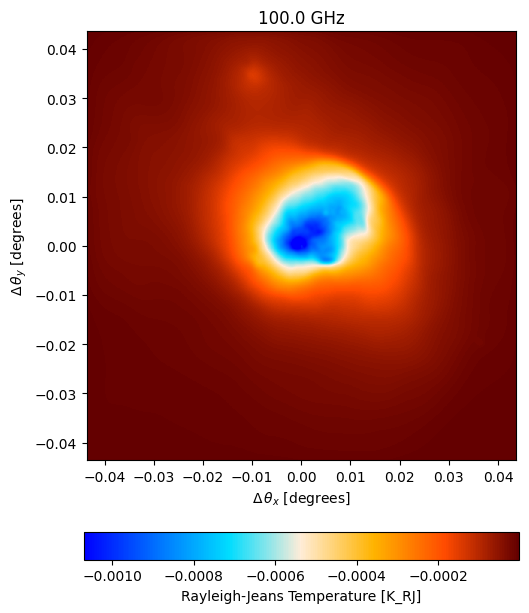

In [1]:
import numpy as np
print(f"numpy version: {np.__version__}")
import matplotlib.pyplot as plt
import maria
import sys
import os

# Relative import of sample_maps for now
sys.path.append(os.path.abspath('../python'))
import mapsampling_jax
from mapsampling_jax import sample_maps

map_filename = maria.io.fetch("maps/cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename, #filename
                                resolution=8.714e-05, #pixel size in degrees
                                index=0, #index for fits file
                                center=(150, 10), # position in the sky
                                units='Jy/pixel' # Units of the input map 
                               )

input_map.to(units="K_RJ").plot()

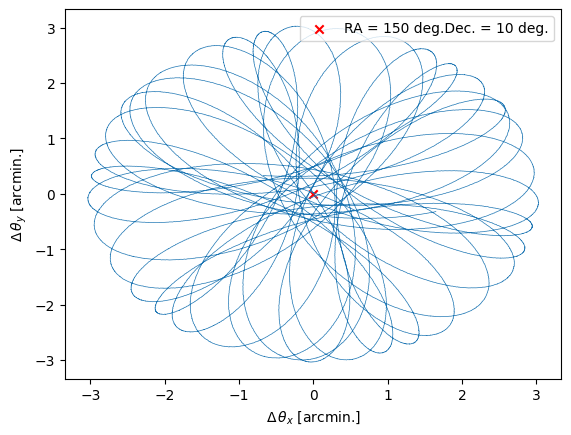

In [2]:
#load the map into maria
plan = maria.get_plan(scan_pattern="daisy", # scanning pattern
                      scan_options={"radius": 0.05, "speed": 0.01}, # in degrees
                      duration=600, # integration time in seconds
                    # duration=60,
                    #   duration=300, # integration time in seconds
                      sample_rate=50, # in Hz
                      scan_center=(150, 10), # position in the sky
                      frame="ra_dec")

plan.plot()

2024-11-04 09:59:36.537 INFO: Initialized base in 1898 ms.
Building atmosphere: 100%|██████████| 6/6 [00:04<00:00,  1.44it/s]
2024-11-04 09:59:42.096 INFO: Initialized atmosphere in 5546 ms.
Generating noise: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


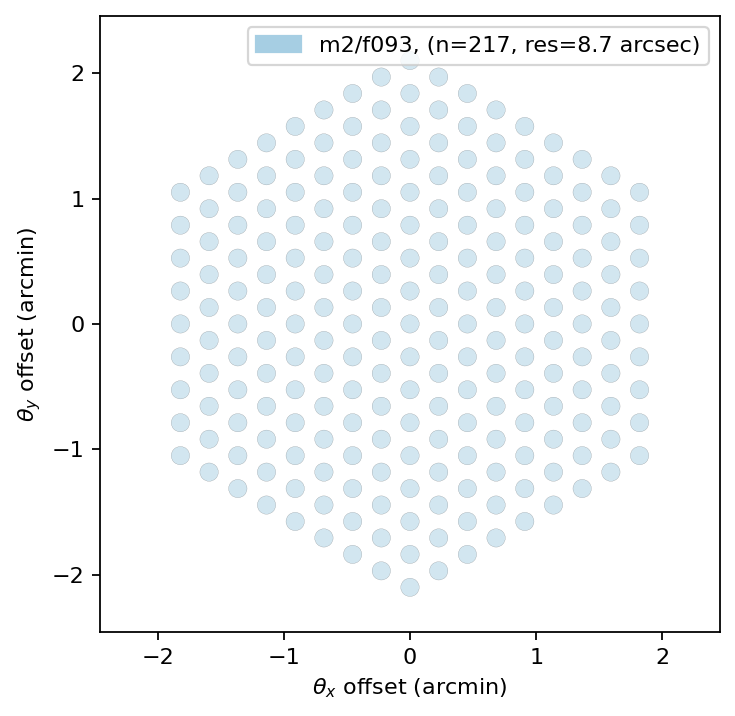

In [3]:
# instrument = maria.get_instrument('MUSTANG-2')
instrument = mapsampling_jax.instrument
instrument.plot()

sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

In [4]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:05<00:00,  5.24s/it]


mapdata_truth shape: (1, 1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


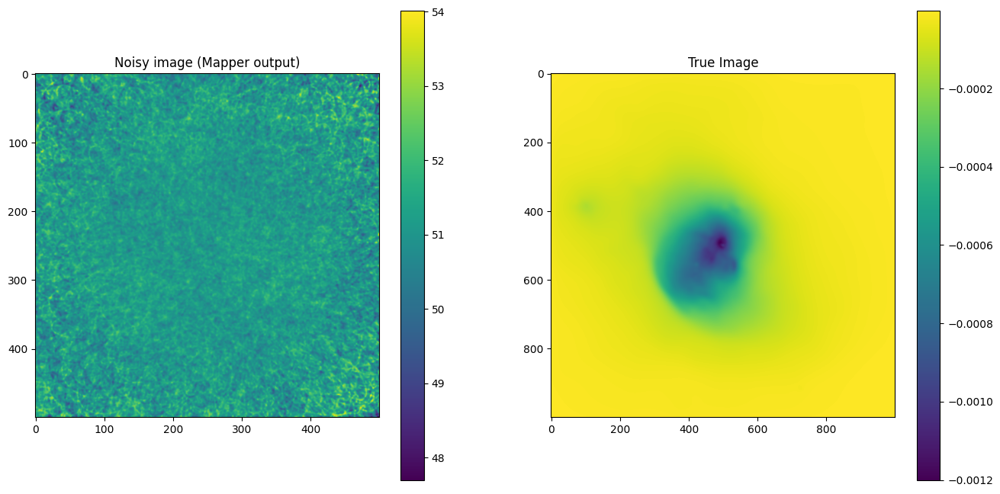

In [5]:
from maria.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 1}} )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0].T)
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0, 0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [6]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

import jax
from jax import random
import jax.numpy as jnp

import nifty8.re as jft
import matplotlib.pyplot as plt

import numpy as np

from functools import reduce
from operator import or_

seed = 42
key = random.PRNGKey(seed)

2024-11-04 10:00:01.000 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-11-04 10:00:01.002 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


# Test TOD agreement:

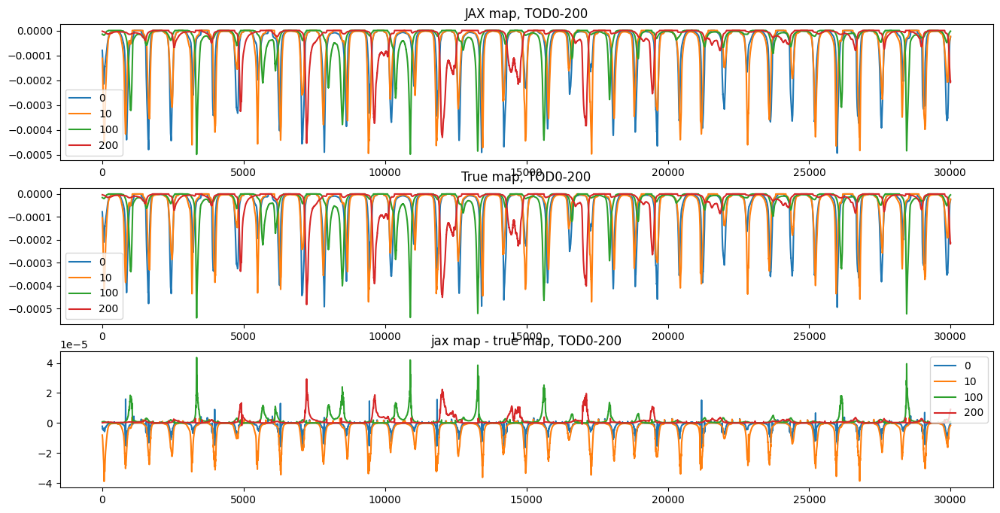

In [7]:
jax_tods_map = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)

    tods_map = np.float64(tod_truthmap.get_field('map').compute())
    im1 = axes[1].plot(tods_map[i], label=i)

    im2 = axes[2].plot(jax_tods_map[i] - tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX map, TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True map, TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'jax map - true map, TOD0-{i}')
axes[2].legend()

plt.show()

# Prepare noised input TODs:

Noise stddev: 0.00025152552136686776


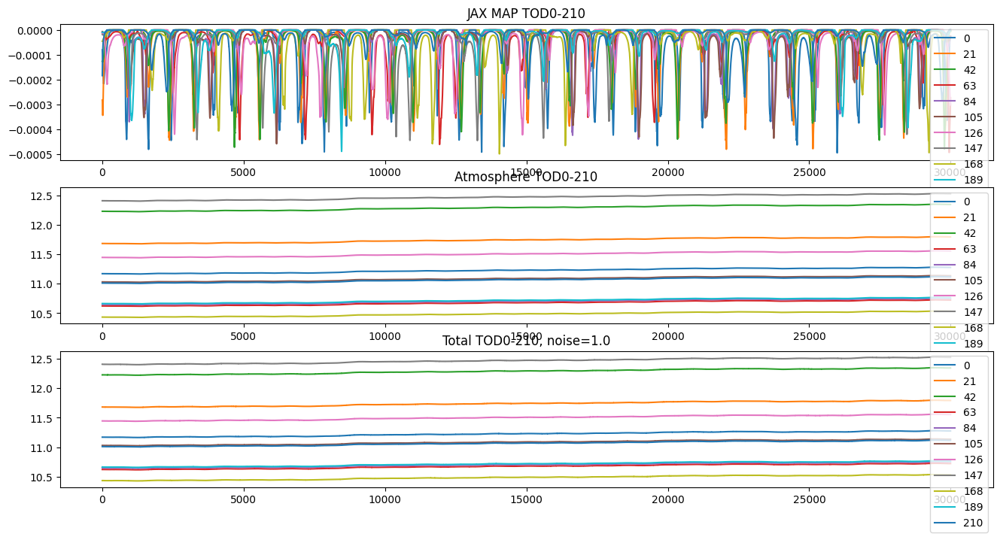

In [8]:
# Pick noise level for rest of run:
# noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
noiselevel = 1.0

# Add n TODs for atmos:
n = jax_tods_map.shape[0]

jax_tods_atmos = tod_truthmap.get_field('atmosphere')
# noised_jax_tod = np.float64(jax_tods_map) + np.float64(jax_tods_atmos) + np.float64(tod_truthmap.components['noise']*noiselevel)

noised_jax_tod = np.float64(jax_tods_map) + np.float64(tod_truthmap.get_field('noise')*noiselevel)
# noised_jax_tod = np.float64(tod_truthmap.get_field('noise')*noiselevel)
noised_jax_tod[:n] += np.float64(jax_tods_atmos[:n]) 

denoised_jax_tod = noised_jax_tod - np.float64(tod_truthmap.get_field('noise')*noiselevel)

print("Noise stddev:", np.std(tod_truthmap.get_field('noise').compute()))

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in range(0, n, n//10):
    im0 = axes[0].plot(jax_tods_map[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos[i], label=i)
    im2 = axes[2].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'Atmosphere TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'Total TOD0-{i}, noise={noiselevel}')
axes[2].legend()

plt.show()

## Test atmosphere slopes:

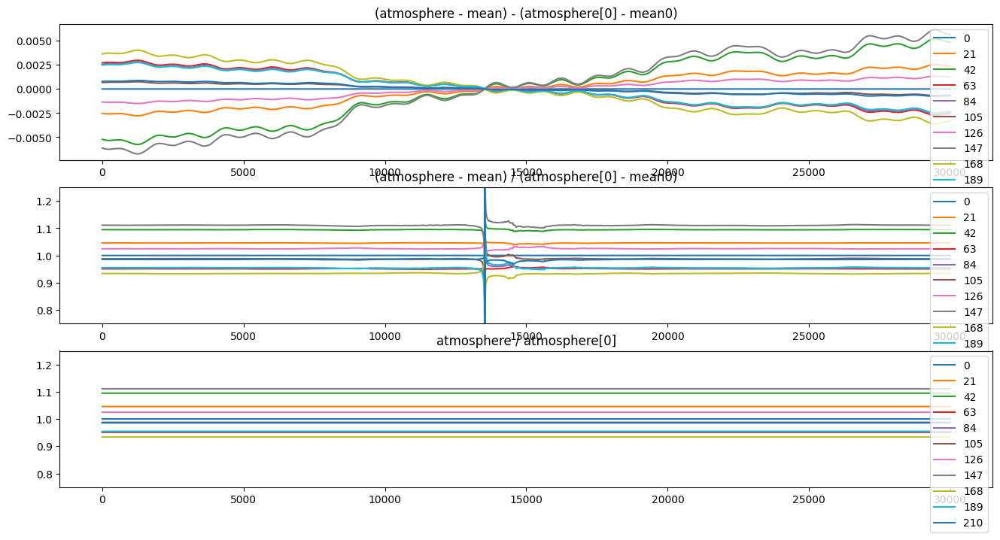

In [9]:
fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in range(0, n, n//10 if n//10 != 0 else 1):
    axes[0].plot(jax_tods_atmos[i] - jax_tods_atmos[i].mean() - (jax_tods_atmos[0] - jax_tods_atmos[0].mean()), label=i)
    axes[1].plot( (jax_tods_atmos[i] - jax_tods_atmos[i].mean()) / (jax_tods_atmos[0] - jax_tods_atmos[0].mean()), label=i)
    axes[2].plot(jax_tods_atmos[i]/jax_tods_atmos[0], label=i)
    
axes[0].title.set_text(f'(atmosphere - mean) - (atmosphere[0] - mean0)')
axes[0].legend()
axes[1].title.set_text(f'(atmosphere - mean) / (atmosphere[0] - mean0)')
axes[1].legend()
axes[1].set_ylim([0.75, 1.25])
axes[2].title.set_text(f'atmosphere / atmosphere[0]')
axes[2].legend()
axes[2].set_ylim([0.75, 1.25])

plt.show()

In [10]:
print("real slopes:")
slopes_truth = (jax_tods_atmos) / (jax_tods_atmos[0])
slopes_truth = np.float64(slopes_truth.mean(axis=1))

slopes = noised_jax_tod / noised_jax_tod[0]
slopes = np.float64(slopes.mean(axis=1))
print(slopes_truth.shape)

slopes_truth - slopes

real slopes:
(217,)


array([ 0.00000000e+00, -2.28567266e-07, -2.11619862e-07, -1.20616542e-07,
       -4.83489117e-07,  4.55096336e-07, -5.24949658e-07,  5.82820733e-07,
       -2.19153982e-07, -1.76648734e-07,  1.01453030e-07, -7.86791389e-07,
       -1.26134383e-06, -1.49167721e-06, -9.68903345e-07, -1.22715623e-06,
       -5.35025784e-08, -9.31348080e-07, -1.72631266e-07, -1.29051475e-06,
       -1.07350623e-06, -9.51470337e-07, -1.44743879e-06, -1.06423032e-06,
       -1.72829144e-06, -2.23166731e-07, -4.69256767e-07, -1.36035126e-06,
       -1.85272483e-06, -5.48566774e-07, -2.63048615e-07, -5.24097871e-07,
       -9.15834514e-07, -1.37948560e-06, -1.97066253e-06, -1.80498368e-06,
       -8.34146136e-07, -2.07878528e-06, -9.44724144e-07, -1.00253010e-06,
       -1.93174842e-06, -2.20357373e-06, -1.55619325e-06, -1.64814368e-06,
       -2.39633660e-06, -2.19640981e-06, -1.84242515e-06, -2.42420080e-06,
       -1.24366807e-06, -9.27106014e-07, -6.22482555e-07, -2.03466933e-06,
       -1.83081345e-06, -

np.float64(1.4768293063968084e-13)

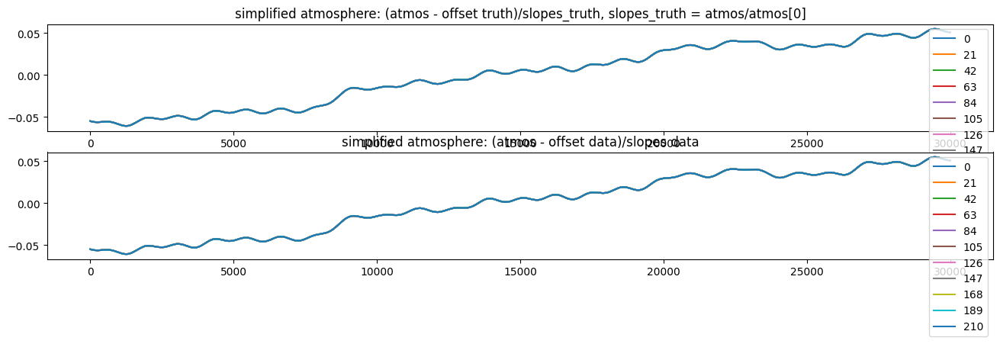

In [11]:
fig, axes = plt.subplots(2, 1, figsize=(16, 4))

# slopes_truth = (jax_tods_atmos - jax_tods_atmos.mean(axis=1)[:, None]) / (jax_tods_atmos[0] - jax_tods_atmos[0].mean())
# slopes_truth = (jax_tods_atmos - jax_tods_atmos.mean()) / (jax_tods_atmos[0] - jax_tods_atmos.mean())

offset_tod_truth = np.float64(jax_tods_atmos.mean(axis=1))
offset_tod = np.float64(noised_jax_tod.mean(axis=1))

atmos_tod_simplified = (jax_tods_atmos - offset_tod_truth[:, None])/slopes_truth[:, None]

for i in range(0, n, n//10 if n//10 != 0 else 1):
    axes[0].plot( atmos_tod_simplified[i], label=i)
    axes[1].plot( (jax_tods_atmos[i] - offset_tod[i])/slopes[i], label=i)

axes[0].title.set_text(f'simplified atmosphere: (atmos - offset truth)/slopes_truth, slopes_truth = atmos/atmos[0]')
axes[0].legend()
axes[1].title.set_text(f'simplified atmosphere: (atmos - offset data)/slopes data')
axes[1].legend()

atmos_tod_simplified.mean().compute()

# Next, initialise nifty prior model

Start with the atmosphere TOD model. For this, we need to re-write the CorrelatedFieldMaker:

In [12]:
from modified_CFM import CFM

In [13]:
# padding_atmos = 2000
# padding_atmos = 5000
padding_atmos = 10000
dims_atmos = ( (jax_tods_atmos.shape[1] + padding_atmos), )
# dims_atmos = ( (jax_tods_atmos.shape[1] - 200 + padding_atmos), )

# correlated field zero mode GP offset and stddev
# cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.0002, 0.0001))
cf_zm_tod = dict(offset_mean=0.0, offset_std=(1e-5, 0.99e-5))

# correlated field fluctuations (mostly don't need tuning)
# fluctuations: y-offset in power spectrum in fourier space (zero mode)
# loglogavgslope: power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
# flexibility=(1.5e0, 5e-1), # deviation from simple power-law
# asperity=(5e-1, 5e-2), # small scale features in power-law
cf_fl_tod = dict(
    fluctuations=(0.0015, 0.0001),
    # loglogavgslope=(-2.5, 0.5), 
    loglogavgslope=(-2.45, 0.1), 
    flexibility=None,
    asperity=None,
)

# put together in correlated field model
# Custom CFM:
cfm_tod = CFM("combcf ")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
# gp_tod = cfm_tod.finalize(n)
gp_tod = cfm_tod.finalize(1)
gp_tod

Model(
	<function CFM.finalize.<locals>.correlated_field at 0x14dccc133380>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x14dccc4f67a0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x14dccc4f67a0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x14dccc4f67a0>, primals=ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<function random_like at 0x14dcc

## Now for the map model:

In [15]:
# padding_map = 100
# dims_map = (1000 + padding_map, 1000 + padding_map)
dims_map = (1000, 1000)

# Map model

# correlated field zero mode GP offset and stddev
cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-8, 1e-7))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    fluctuations=(5.6e-5, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    # loglogavgslope=(-2.5e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    loglogavgslope=(-2.5, 0.1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims_map, distances=1.0 / dims_map[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

# Define offset NormalPrior:

In [16]:
# offset_dict = dict(mean = 0.0, std = 0.6, shape=(n,))
# offset_tod = jft.NormalPrior(**offset_dict, name='offset')

# offset_tod

## TOD slope Normal Prior:

In [17]:
# slope_dict = dict(mean = 0.0, std = 0.6, shape=(n,))
# slopes_tod = jft.NormalPrior(**slope_dict, name='tod_slopes')

# Using CFM - combined

In [18]:
class Signal_TOD(jft.Model):
    def __init__(self, gp_tod, offset_tod_truth, slopes_truth, gp_map):
        self.gp_tod = gp_tod
        self.gp_map = gp_map
        self.offset_tod_truth = offset_tod_truth[:, None]
        self.slopes_truth = slopes_truth[:, None]

        # super().__init__(init = self.gp_tod.init | self.gp_map.init | self.offset_tod.init,
        #                  domain = self.gp_tod.domain | self.gp_map.domain | self.offset_tod.domain)
        super().__init__(init = self.gp_tod.init | self.gp_map.init,
                        domain = self.gp_tod.domain | self.gp_map.domain )


    def __call__(self, x):
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = self.gp_tod(x_tod)
        # res_tods = self.gp_tod(x['tod'])

        # From TOD-only fit:
        res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2] * self.slopes_truth + self.offset_tod_truth
        # res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2]

        # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1]))[:, padding_map//2:-padding_map//2, padding_map//2:-padding_map//2], dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        modified_res_map = res_map.at[:n, :].add(res_tods_offset)

        return modified_res_map

# map-only:

In [19]:
class Signal_TOD_map(jft.Model):
    def __init__(self, gp_map):
        self.gp_map = gp_map
        super().__init__(init = self.gp_map.init,
                        domain = self.gp_map.domain )

    def __call__(self, x):
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

        return res_map

# CFM - TOD

In [20]:
class Signal_TOD_tod(jft.Model):
    def __init__(self, gp_tod, offset_tod_truth, slopes_truth):
        self.gp_tod = gp_tod
        self.offset_tod_truth = offset_tod_truth[:, None]
        self.slopes_truth = slopes_truth[:, None]

        super().__init__(init = self.gp_tod.init,
                        domain = self.gp_tod.domain )

    def __call__(self, x):
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = self.gp_tod(x_tod)
        # res_tods = self.gp_tod(x['tod'])

        # From TOD-only fit:
        res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2] * self.slopes_truth + self.offset_tod_truth
        # res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2]


        return res_tods_offset

# Define which signal response to use:

In [21]:
# signal_response_tod = Signal_TOD(gp_tod, offset_tod_truth, slopes_truth, gp_map) # combined with truth slopes & offsets
signal_response_tod = Signal_TOD(gp_tod, offset_tod, slopes, gp_map) # combined with data slopes & offsets
# signal_response_tod = Signal_TOD_map(gp_map) # map-only
# signal_response_tod = Signal_TOD_tod(gp_tod, offset_tod_truth, slopes_truth) # tod-only

In [22]:
# Define noise covariance
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x


# Test with simple atmos TODs:
# noised_jax_tod = np.float64(atmos_tod_simplified)[:n] + np.float64(tod_truthmap.get_field('noise')*noiselevel)[:n] + np.float64(jax_tods_map)[:n]
# denoised_jax_tod = np.float64(atmos_tod_simplified)[:n]

# Combine in likelihood - only fit 0th TOD for now!
# truth = noised_jax_tod[:n]
truth = noised_jax_tod
print(noised_jax_tod.shape)
# truth = noised_jax_tod[:, 100:-100]

lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


(217, 30000)


In [23]:
signal_response_tod

Signal_TOD(
	<bound method Signal_TOD.__call__>,
	domain={'cfmapax1fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapax1loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapxi': ShapeWithDtype(shape=(1000, 1000), dtype=<class 'jax.numpy.float64'>),
	 'cfmapzeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'cfmapax1fluctuations': functools.partial(<function random_like at 0x14bf904428e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'cfmapax1loglogavgslope': functools.partial(<function random_like at 0x14bf9

# Draw Prior sample

(217, 30000)


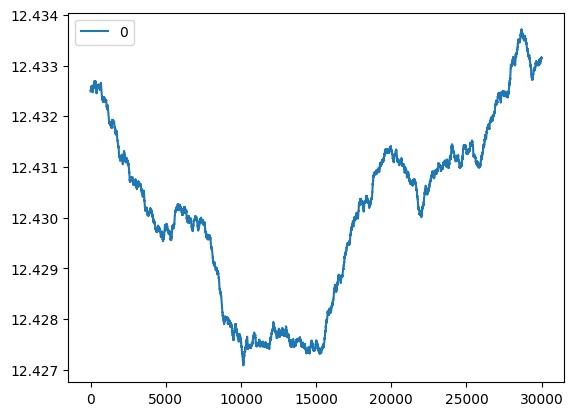

In [24]:
key, sub = jax.random.split(key)
xi = jft.random_like(sub, signal_response_tod.domain)
res = signal_response_tod(xi)
print(res.shape)

# for i in range(res.shape[0]):
# for i in range(0, n, n//10):
for i in [0]:
    plt.plot(np.arange(0, res.shape[1]), res[i], label=i)
plt.legend()
plt.show()

# MAP fit

In [25]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001
M: →:1.0 ↺:False #∇²:06 |↘|:1.950857e+02 ➽:1.040006e+02
M: Iteration 1 ⛰:+3.261653e+08 Δ⛰:5.258031e+09
M: →:1.0 ↺:False #∇²:12 |↘|:9.542888e+01 ➽:1.040006e+02
M: Iteration 2 ⛰:+2.142056e+08 Δ⛰:1.119597e+08
OPTIMIZE_KL: Iteration 0001 ⛰:+2.1421e+08
OPTIMIZE_KL: #(KL minimization steps) 2
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²: 6.6e+01±     0.0, avg:     +1.0±     0.0, #dof:6510000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'reduced χ²:    0.17±     0.0, avg:    -0.41±     0.0, #dof:      1'
cfmapax1loglogavgslope  :: 'reduced χ²:    0.26±     0.0, avg:    -0.51±     0.0, #dof:      1'
cfmapxi                 :: 'reduced χ²:     1.0±     0.0, avg: +0.00066±     0.0, #dof:1000000'
cfmapzeromode           :: 'reduced χ²:    0.17±     0.0, avg:    -0.41±     0.0, #dof:      1'
combcf tod fluctuations :: 'reduced χ²:     2.2±     0.0, avg:     -1.5±     0.0, #dof:      1'
combcf tod loglogavgslope:: 'reduced χ²: 2.1e+01±     0.0, avg:   

In [26]:
samples.pos

Vector(
	{'cfmapax1fluctuations': Array(-0.41166838, dtype=float64),
	 'cfmapax1loglogavgslope': Array(-0.51388311, dtype=float64),
	 'cfmapxi': Array([[-1.03496617,  0.83208743,  0.84980087, ..., -0.99227659,
	         0.94252933, -1.07407737],
	       [-0.38872154,  2.13842377,  1.14307519, ..., -0.18954447,
	         0.09899365,  0.05604782],
	       [ 0.66854061,  1.0173047 , -1.10349112, ...,  1.24491411,
	         0.51682631,  1.33038348],
	       ...,
	       [-1.60283062, -0.2549469 , -1.48609242, ..., -0.6318798 ,
	         1.6322849 , -1.20604412],
	       [ 1.20349404,  0.66891157, -0.80285793, ...,  0.55188448,
	         0.34746849,  1.34676753],
	       [-0.17107425,  0.49422092, -0.82164192, ...,  0.60539666,
	        -0.23118761, -0.4781253 ]], dtype=float64),
	 'cfmapzeromode': Array(-0.4088261, dtype=float64),
	 'combcf tod fluctuations': Array(-1.49080895, dtype=float64),
	 'combcf tod loglogavgslope': Array(4.62575292, dtype=float64),
	 'combcf xi': Array([[ -0.08502

In [27]:
def printfitresults():
    print("Fit Results (res, init, std)")

    print("\nTODs:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['combcf tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['combcf tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['combcf zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")
    
    print("map:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_map['offset_std'])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_std'][0]}, {cf_zm_map['offset_std'][1]}")
    
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.0013552293632223883, 0.0015, 0.0001
	loglogvarslope: -1.9874247075618094, -2.45, 0.1
	zeromode std (LogNormal): 1.8251745316147208e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.5581012563596575e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5513883113255367, -2.5, 0.1
	zeromode std (LogNormal): 4.134373046825607e-10, 1e-08, 1e-07


(217, 30000)


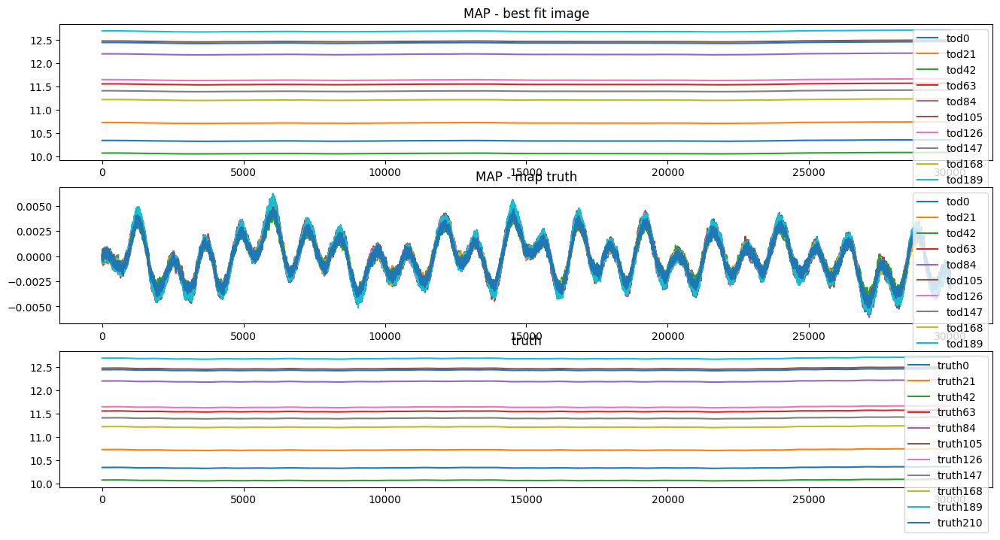

In [28]:
res = signal_response_tod(samples.pos)
print(res.shape)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in range(0, res.shape[0], res.shape[0]//10):
for i in range(0, n, n//10):
    im0 = axes[0].plot(np.arange(0, res.shape[1]), res[i], label=f"tod{i}")
    im1 = axes[1].plot(np.arange(0, res.shape[1]), res[i] - truth[i], label=f"tod{i}")
    im2 = axes[2].plot(truth[i], label=f"truth{i}")

axes[0].title.set_text('MAP - best fit image')
axes[0].legend()
axes[1].title.set_text('MAP - map truth')
axes[1].legend()
axes[2].title.set_text('truth')
axes[2].legend()

plt.show()

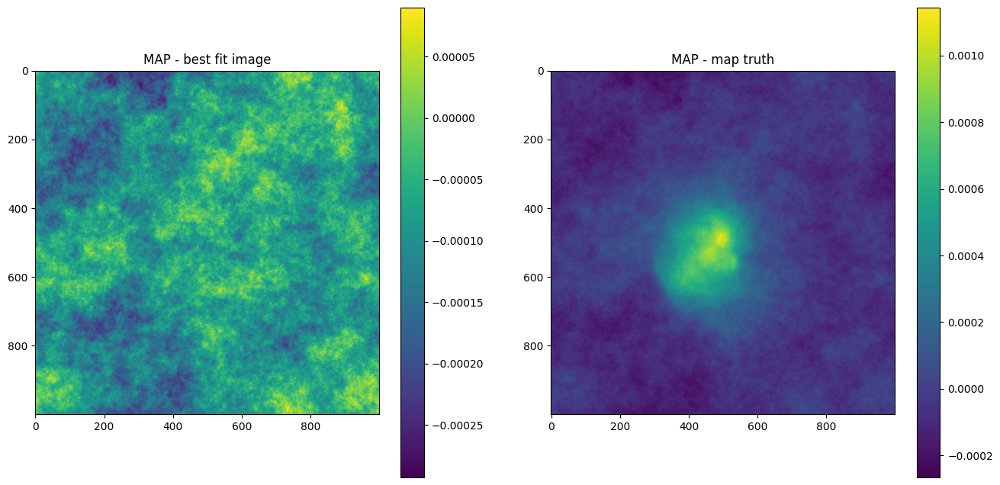

In [29]:
# plot maximum of posterior (mode)
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('MAP - best fit image')
fig.colorbar(im0)

im1 = axes[1].imshow( sig_map - mapdata_truth[0, 0] )
axes[1].title.set_text('MAP - map truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

In [30]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+1.4843e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.5277e+07 Δ⛰:1.3315e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+9.1635e+06 Δ⛰:6.1133e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+3.8528e+06 Δ⛰:5.3107e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+2.1983e+06 Δ⛰:1.6545e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+1.6550e+06 Δ⛰:5.4329e+05 ➽:1.0400e+01
SL: Iteration 6 ⛰:+7.0951e+05 Δ⛰:9.4548e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+3.2531e+05 Δ⛰:3.8419e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.4083e+05 Δ⛰:1.8448e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+2.3617e+04 Δ⛰:1.1721e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:-9.8478e+04 Δ⛰:1.2209e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:-1.2366e+05 Δ⛰:2.5185e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-1.7936e+05 Δ⛰:5.5696e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-2.4044e+05 Δ⛰:6.1076e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-2.4239e+05 Δ⛰:1.9572e+03 ➽:1.0400e+01
SL: Iteration 15 ⛰:-2.6992e+05 Δ⛰:2.7523e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-3.2082e+05 Δ⛰:5.0908e+04 ➽:1.0400e+01
SL: 

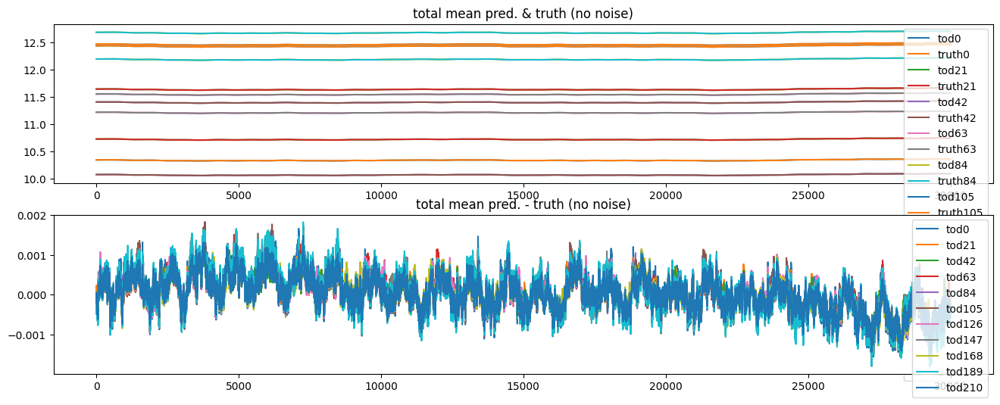

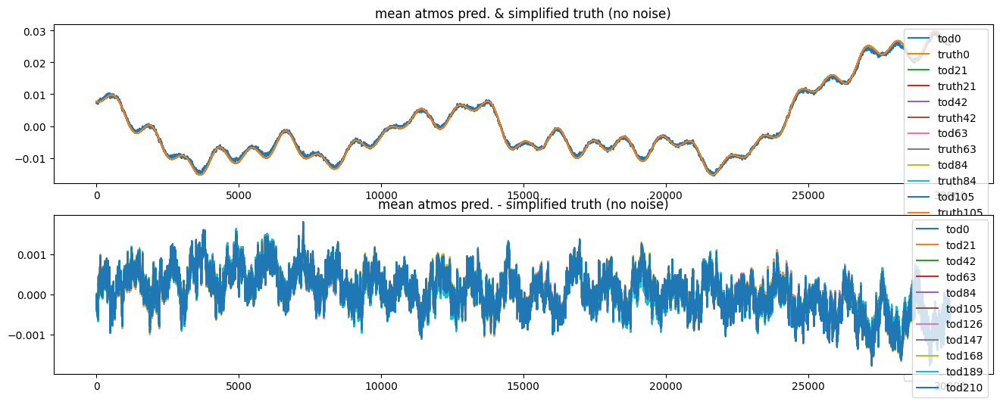

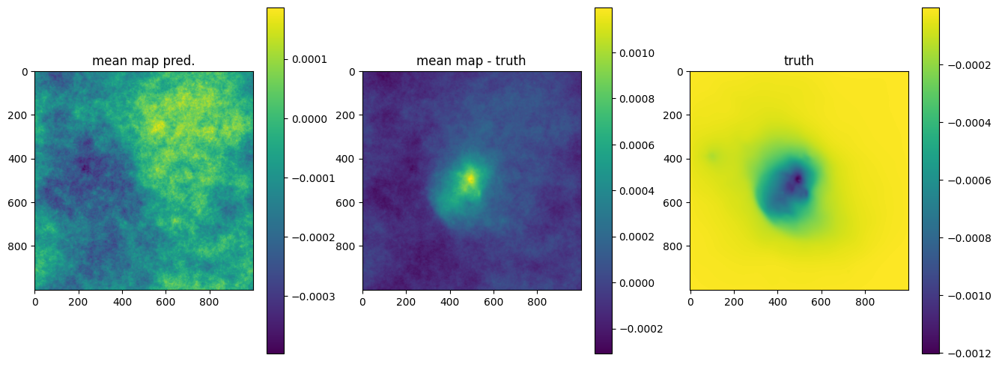

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+8.4039e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+4.3983e+07 Δ⛰:4.0055e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.7731e+07 Δ⛰:2.6252e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.0935e+07 Δ⛰:6.7965e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+9.6614e+06 Δ⛰:1.2733e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+7.6744e+06 Δ⛰:1.9870e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+6.5181e+06 Δ⛰:1.1563e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+5.4384e+06 Δ⛰:1.0797e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+4.7333e+06 Δ⛰:7.0513e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+4.0697e+06 Δ⛰:6.6355e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+3.5557e+06 Δ⛰:5.1400e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+3.1732e+06 Δ⛰:3.8256e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+2.7498e+06 Δ⛰:4.2337e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+2.7307e+06 Δ⛰:1.9115e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:+2.4280e+06 Δ⛰:3.0266e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+2.2056e+06 Δ⛰:2.2248e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+1.9803e+06 Δ⛰:2.2530e+05 ➽:1.0400e+01
SL: 

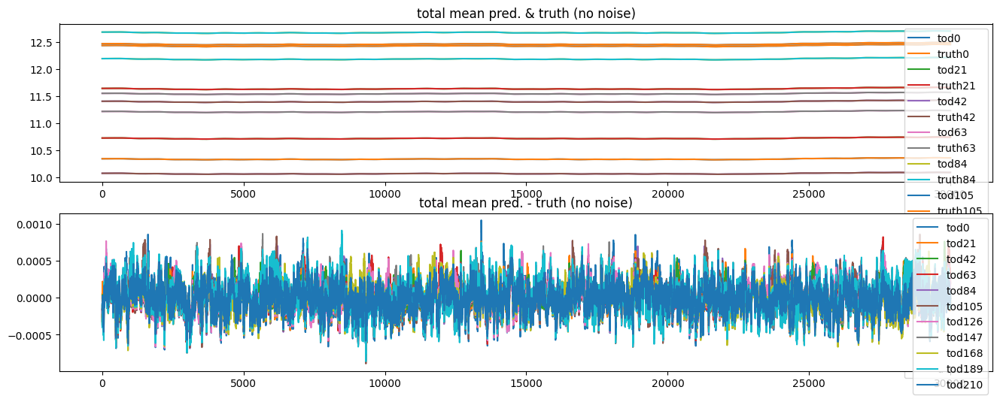

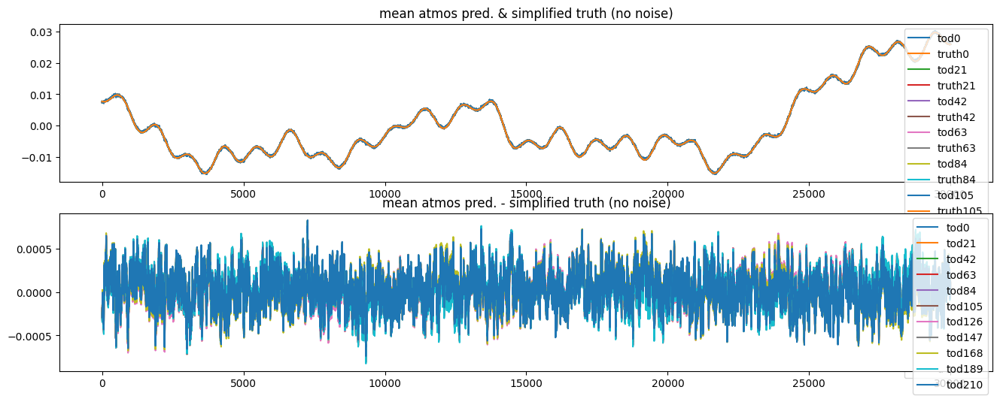

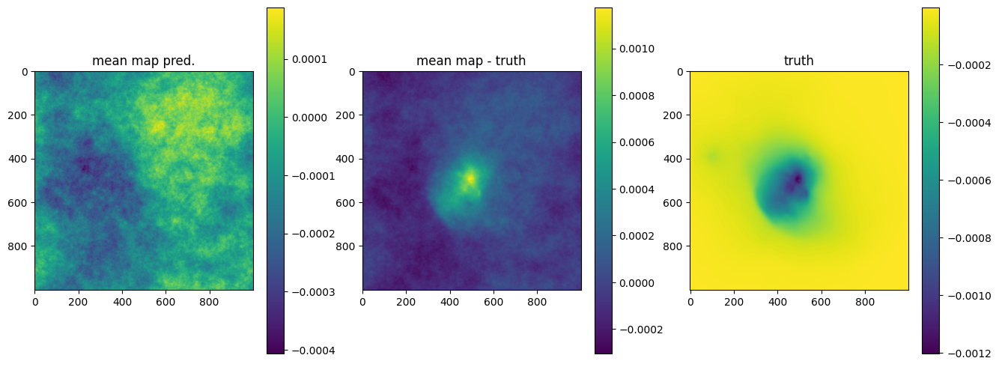

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+4.4759e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+2.5345e+07 Δ⛰:1.9414e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.1124e+07 Δ⛰:4.2212e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.6247e+07 Δ⛰:4.8769e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.2090e+07 Δ⛰:4.1571e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+9.2840e+06 Δ⛰:2.8056e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+6.2635e+06 Δ⛰:3.0205e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+4.4440e+06 Δ⛰:1.8196e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+3.9115e+06 Δ⛰:5.3247e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+3.0046e+06 Δ⛰:9.0689e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+2.7279e+06 Δ⛰:2.7674e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+2.2666e+06 Δ⛰:4.6126e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+1.8972e+06 Δ⛰:3.6939e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+1.7475e+06 Δ⛰:1.4968e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+1.6916e+06 Δ⛰:5.5960e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:+1.4851e+06 Δ⛰:2.0650e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+1.3149e+06 Δ⛰:1.7017e+05 ➽:1.0400e+01
SL: 

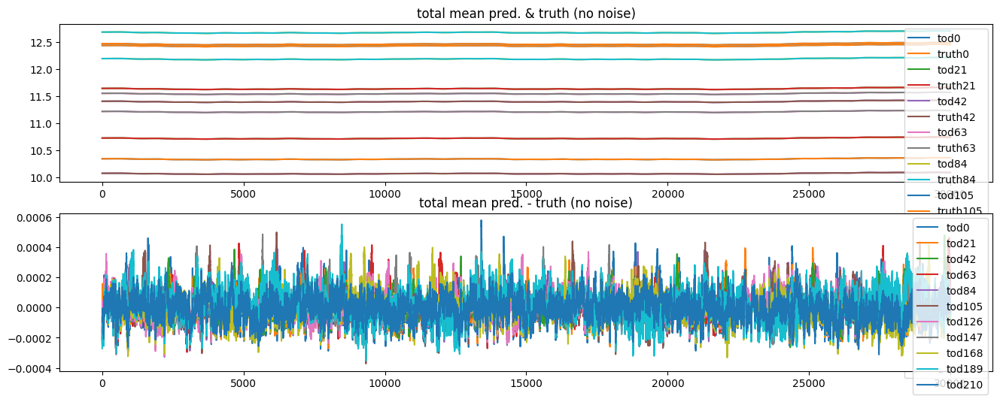

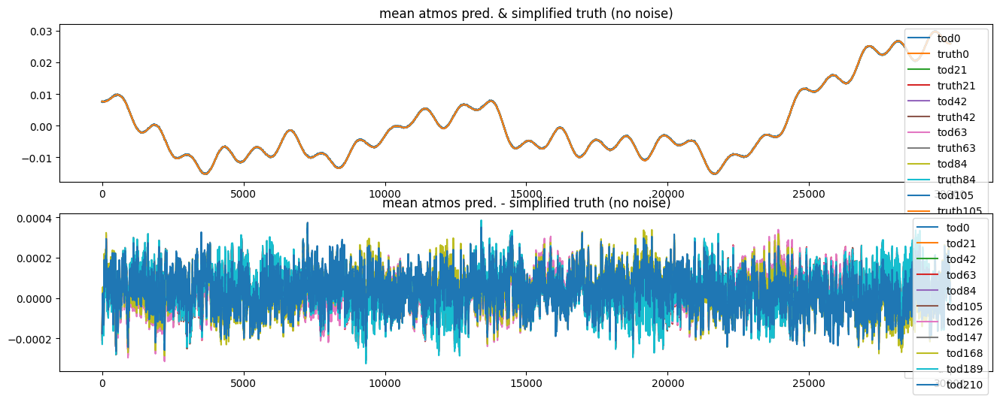

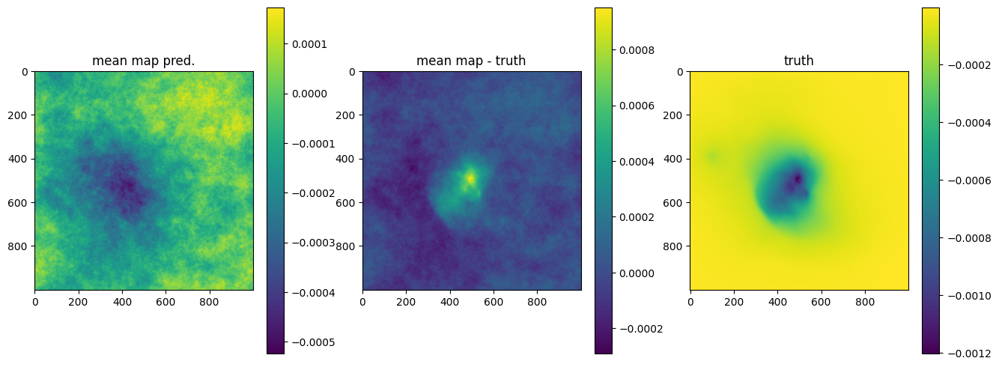

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+1.5328e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+2.9879e+07 Δ⛰:1.2340e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.9326e+07 Δ⛰:1.0553e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.4618e+07 Δ⛰:4.7088e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+8.5766e+06 Δ⛰:6.0410e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+5.2202e+06 Δ⛰:3.3564e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+3.3404e+06 Δ⛰:1.8798e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+2.4667e+06 Δ⛰:8.7369e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.6185e+06 Δ⛰:8.4823e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.2811e+06 Δ⛰:3.3744e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+1.1383e+06 Δ⛰:1.4277e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+9.7699e+05 Δ⛰:1.6133e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+8.2411e+05 Δ⛰:1.5287e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+7.2392e+05 Δ⛰:1.0019e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+7.1819e+05 Δ⛰:5.7262e+03 ➽:1.0400e+01
SL: Iteration 15 ⛰:+5.9849e+05 Δ⛰:1.1970e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+5.8873e+05 Δ⛰:9.7663e+03 ➽:1.0400e+01
SL: 

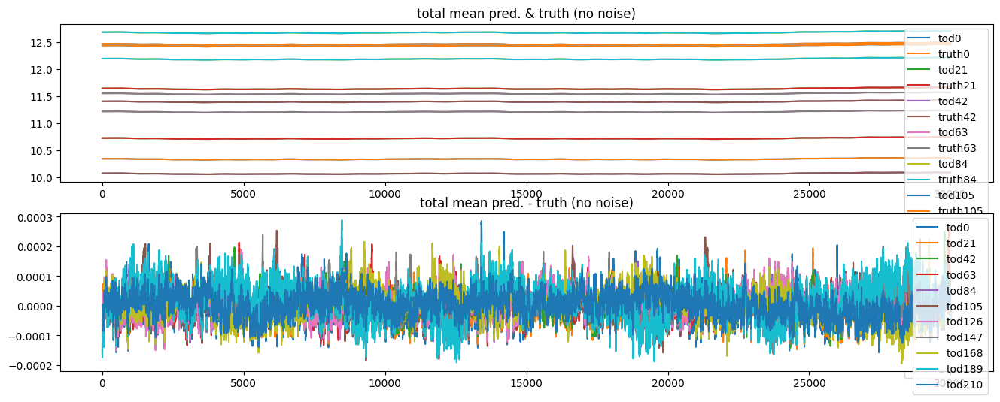

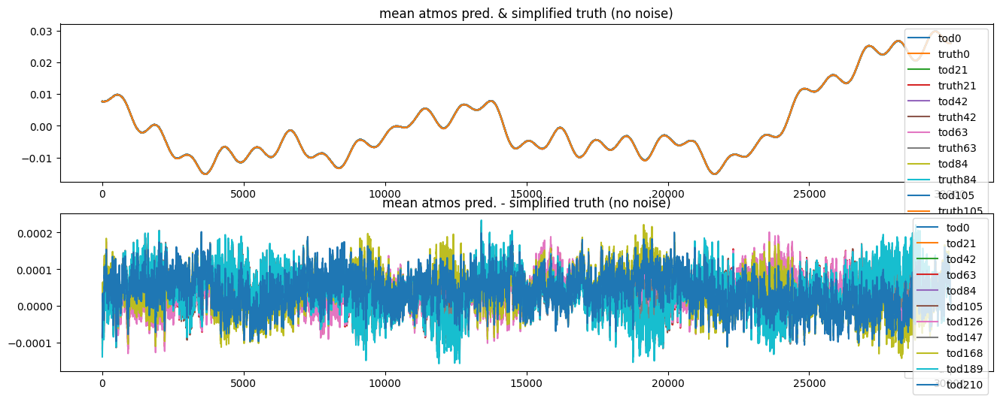

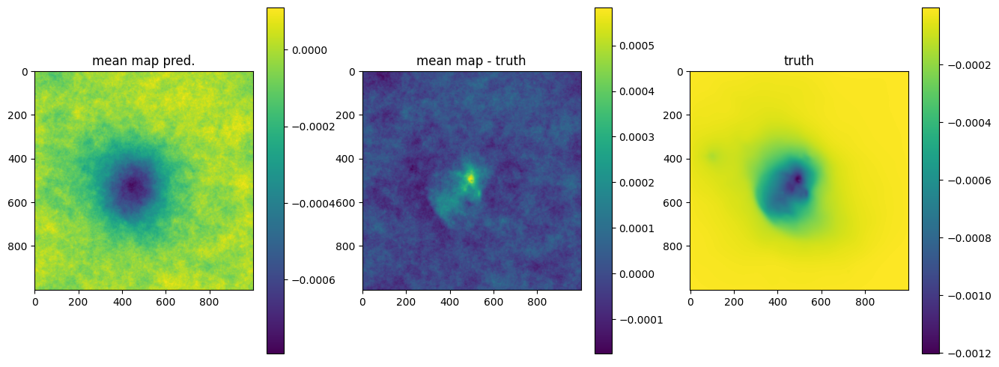

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+3.7628e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+2.3046e+07 Δ⛰:1.4581e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.3812e+07 Δ⛰:9.2343e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+6.9896e+06 Δ⛰:6.8224e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+4.2249e+06 Δ⛰:2.7647e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+3.1385e+06 Δ⛰:1.0863e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.7966e+06 Δ⛰:1.3420e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+1.1200e+06 Δ⛰:6.7655e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+6.9906e+05 Δ⛰:4.2094e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+4.3253e+05 Δ⛰:2.6652e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+3.1678e+05 Δ⛰:1.1575e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+2.3797e+05 Δ⛰:7.8810e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:+1.3637e+05 Δ⛰:1.0160e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+1.3450e+05 Δ⛰:1.8672e+03 ➽:1.0400e+01
SL: Iteration 14 ⛰:+3.6812e+04 Δ⛰:9.7689e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-2.8409e+04 Δ⛰:6.5221e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-5.9070e+04 Δ⛰:3.0661e+04 ➽:1.0400e+01
SL: 

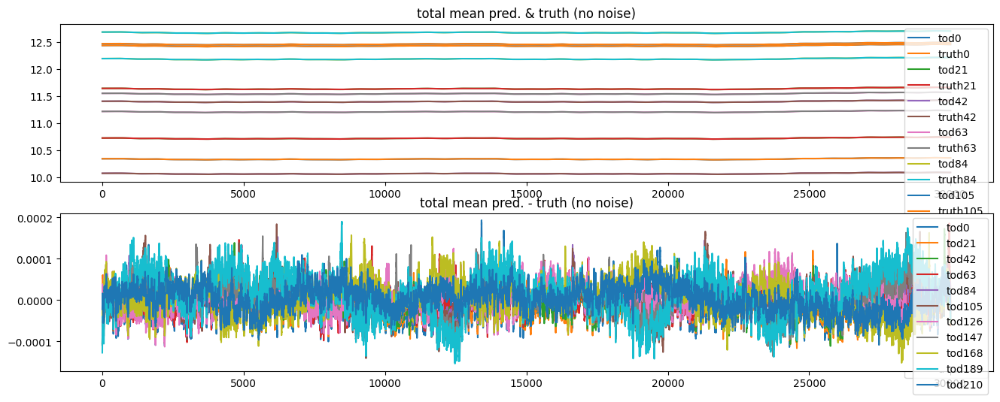

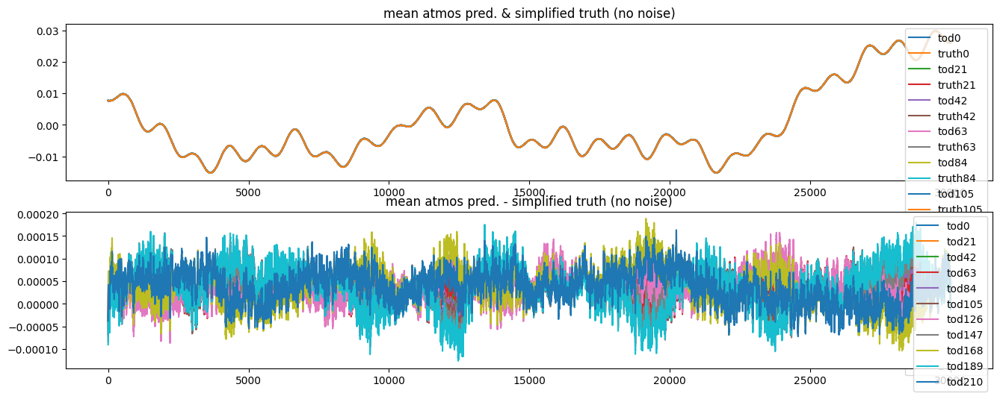

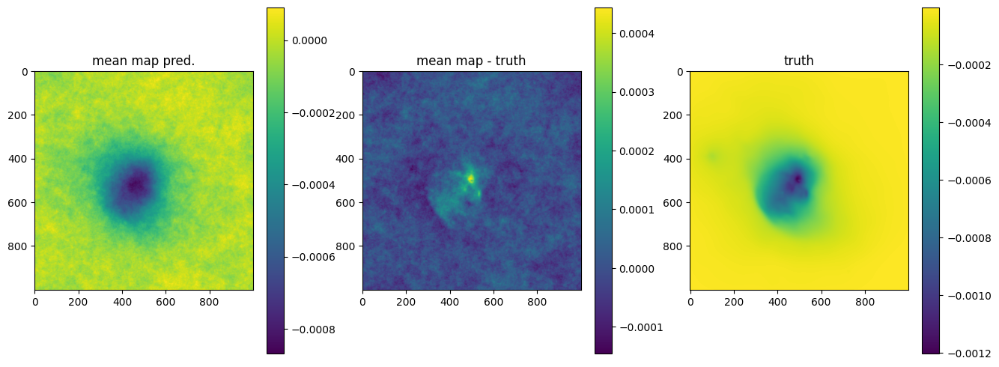

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+1.1253e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.0917e+07 Δ⛰:1.0161e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+7.3337e+06 Δ⛰:3.5834e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+3.7773e+06 Δ⛰:3.5564e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+2.5024e+06 Δ⛰:1.2749e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+1.1838e+06 Δ⛰:1.3186e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+5.4630e+05 Δ⛰:6.3748e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+2.3748e+05 Δ⛰:3.0881e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.7978e+05 Δ⛰:5.7700e+04 ➽:1.0400e+01
SL: Iteration 9 ⛰:+3.6223e+04 Δ⛰:1.4356e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:-3.8470e+04 Δ⛰:7.4693e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:-8.2777e+04 Δ⛰:4.4307e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-8.8918e+04 Δ⛰:6.1405e+03 ➽:1.0400e+01
SL: Iteration 13 ⛰:-1.3293e+05 Δ⛰:4.4013e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-1.6943e+05 Δ⛰:3.6494e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-1.9732e+05 Δ⛰:2.7895e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-2.3637e+05 Δ⛰:3.9049e+04 ➽:1.0400e+01
SL: 

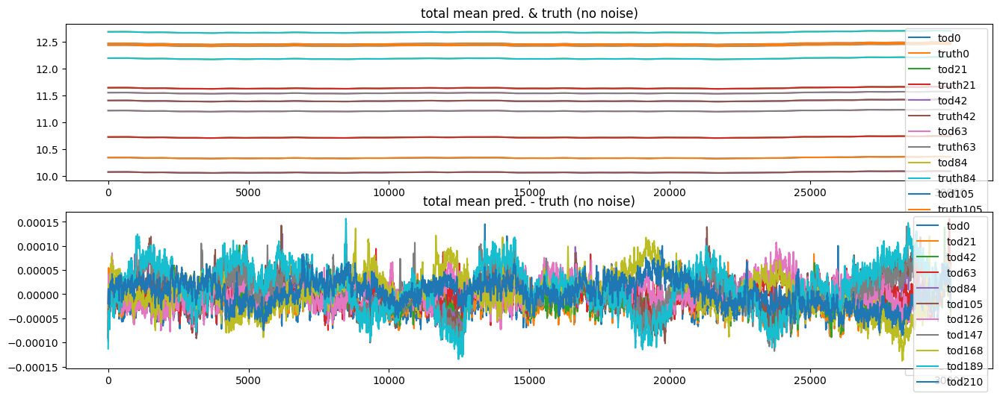

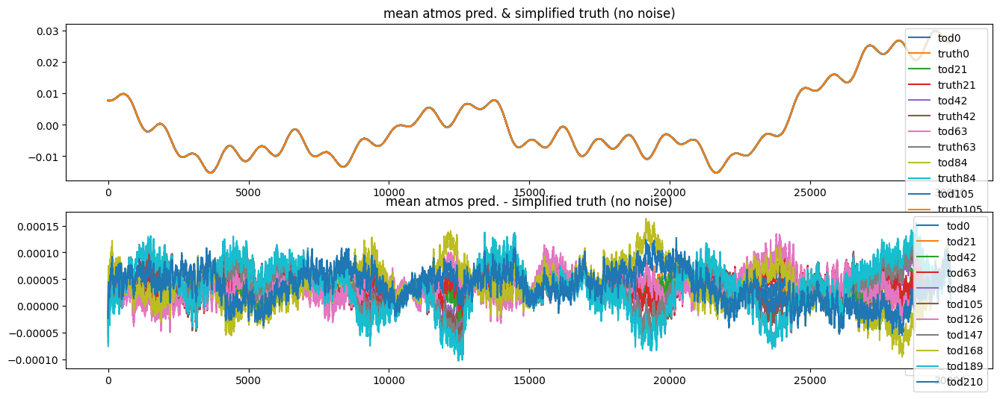

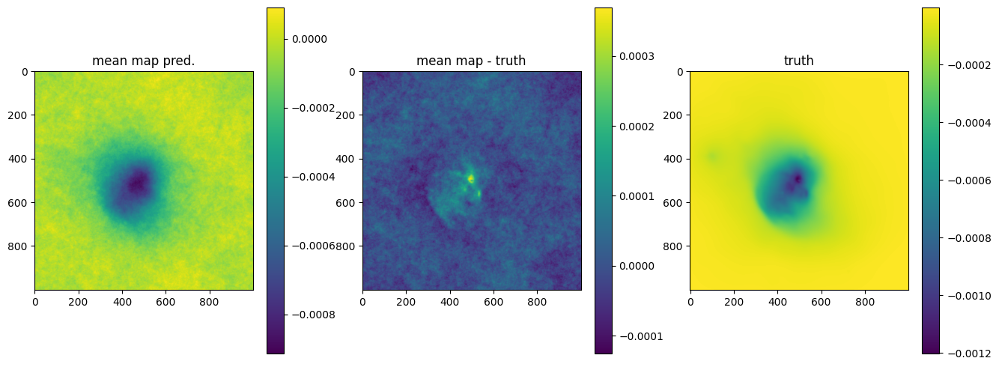

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+6.9597e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+2.5997e+07 Δ⛰:4.3600e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.4656e+07 Δ⛰:1.1341e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+7.4772e+06 Δ⛰:7.1789e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+3.8521e+06 Δ⛰:3.6251e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+2.1798e+06 Δ⛰:1.6724e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.2763e+06 Δ⛰:9.0349e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+4.9989e+05 Δ⛰:7.7638e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.2931e+05 Δ⛰:3.7058e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+2.5557e+04 Δ⛰:1.0375e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:-1.1980e+05 Δ⛰:1.4536e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:-1.9879e+05 Δ⛰:7.8985e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-2.0044e+05 Δ⛰:1.6480e+03 ➽:1.0400e+01
SL: Iteration 13 ⛰:-2.5103e+05 Δ⛰:5.0591e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-2.8542e+05 Δ⛰:3.4392e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-2.9854e+05 Δ⛰:1.3117e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-3.3298e+05 Δ⛰:3.4442e+04 ➽:1.0400e+01
SL: 

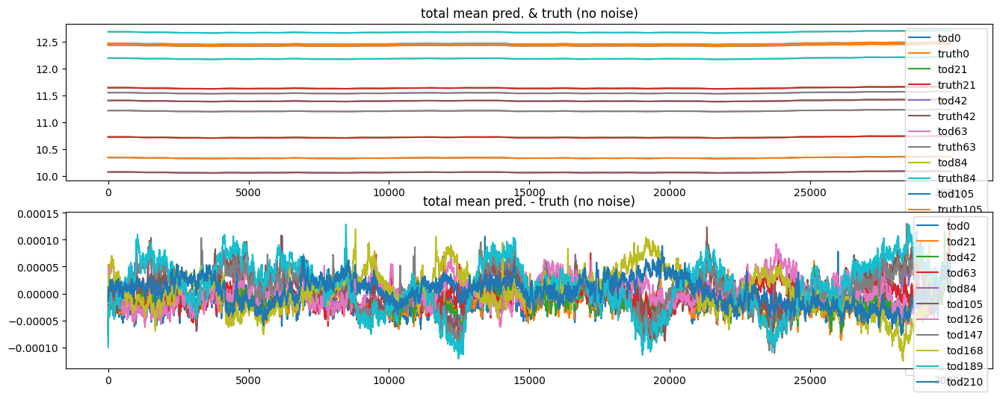

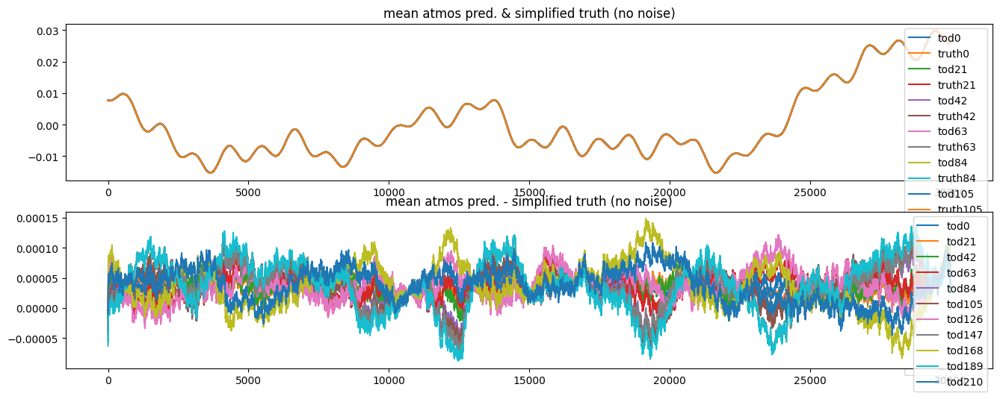

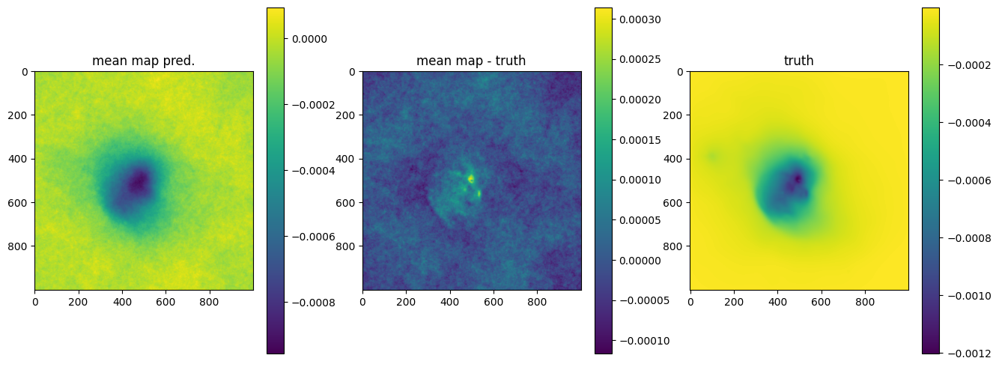

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+8.3634e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+2.2332e+07 Δ⛰:6.1302e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+8.4573e+06 Δ⛰:1.3875e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+3.2590e+06 Δ⛰:5.1982e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+2.7682e+06 Δ⛰:4.9088e+05 ➽:1.0400e+01
SL: Iteration 5 ⛰:+9.2826e+05 Δ⛰:1.8399e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+5.2176e+05 Δ⛰:4.0650e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+1.9163e+05 Δ⛰:3.3012e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:-4.6029e+04 Δ⛰:2.3766e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:-9.9151e+04 Δ⛰:5.3123e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:-1.5252e+05 Δ⛰:5.3369e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:-2.2086e+05 Δ⛰:6.8336e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-2.2371e+05 Δ⛰:2.8523e+03 ➽:1.0400e+01
SL: Iteration 13 ⛰:-2.8355e+05 Δ⛰:5.9838e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-2.9922e+05 Δ⛰:1.5672e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-3.3232e+05 Δ⛰:3.3097e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-3.3634e+05 Δ⛰:4.0244e+03 ➽:1.0400e+01
SL: 

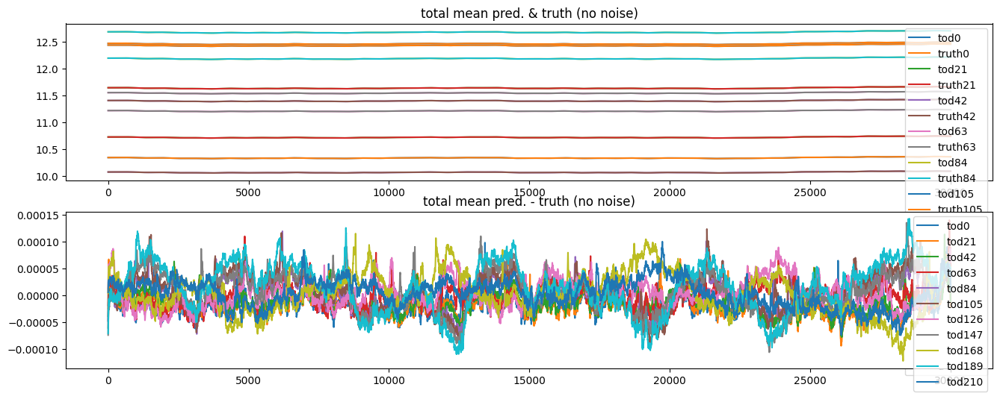

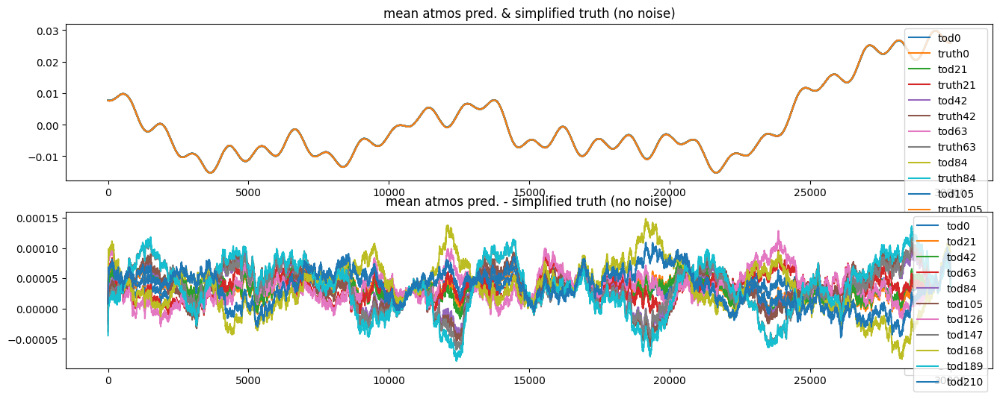

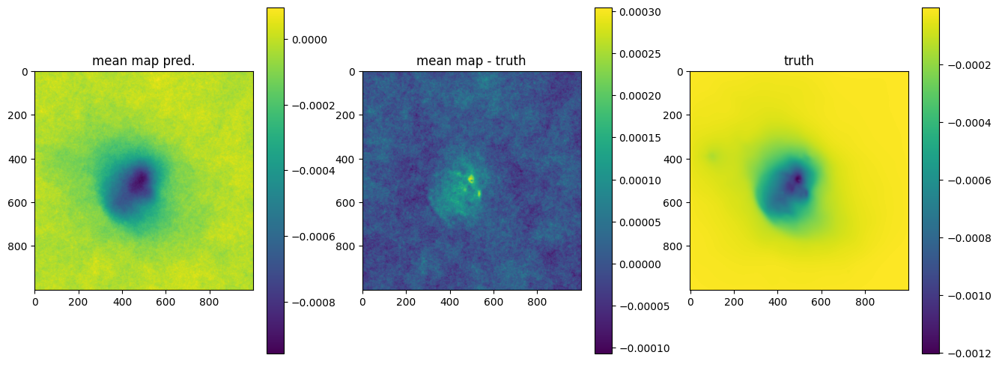

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+6.6974e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+9.9182e+06 Δ⛰:5.7056e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+5.5513e+06 Δ⛰:4.3668e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+3.2851e+06 Δ⛰:2.2662e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.6760e+06 Δ⛰:1.6091e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+4.1902e+05 Δ⛰:1.2570e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+2.4554e+05 Δ⛰:1.7348e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:-9.4282e+04 Δ⛰:3.3982e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:-1.8328e+05 Δ⛰:8.8997e+04 ➽:1.0400e+01
SL: Iteration 9 ⛰:-2.4699e+05 Δ⛰:6.3708e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:-2.9980e+05 Δ⛰:5.2817e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:-3.3243e+05 Δ⛰:3.2628e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-3.6076e+05 Δ⛰:2.8332e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-3.8696e+05 Δ⛰:2.6200e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-3.8788e+05 Δ⛰:9.1094e+02 ➽:1.0400e+01
SL: Iteration 15 ⛰:-4.2061e+05 Δ⛰:3.2736e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-4.2138e+05 Δ⛰:7.6455e+02 ➽:1.0400e+01
SL: 

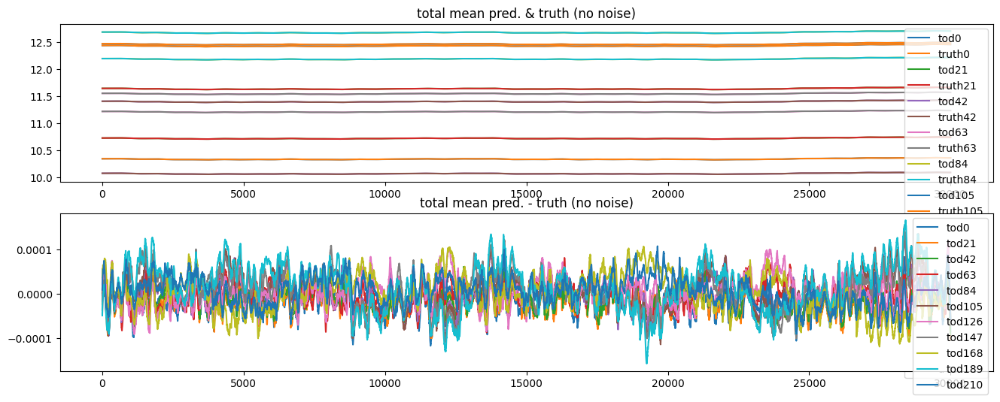

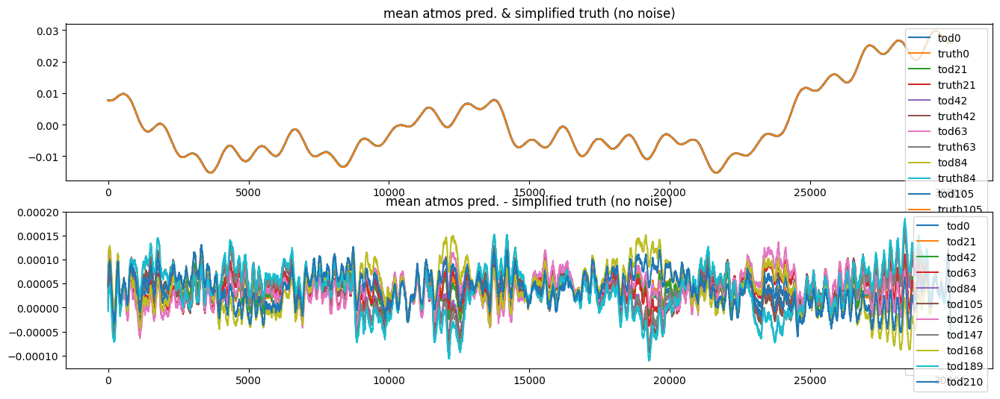

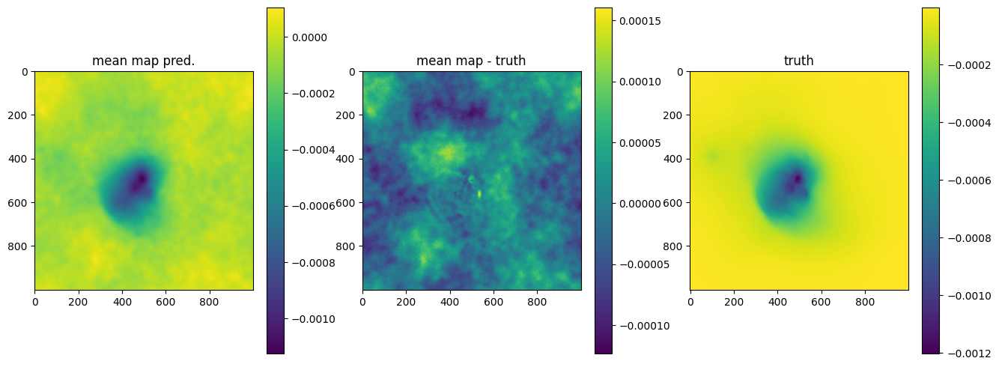

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+5.7673e+06 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+3.0423e+06 Δ⛰:2.7250e+06 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.6163e+06 Δ⛰:4.2600e+05 ➽:1.0400e+01
SL: Iteration 3 ⛰:+7.3657e+05 Δ⛰:1.8798e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+4.8500e+05 Δ⛰:2.5156e+05 ➽:1.0400e+01
SL: Iteration 5 ⛰:+2.4998e+05 Δ⛰:2.3502e+05 ➽:1.0400e+01
SL: Iteration 6 ⛰:-9.0186e+04 Δ⛰:3.4017e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:-1.7795e+05 Δ⛰:8.7765e+04 ➽:1.0400e+01
SL: Iteration 8 ⛰:-2.5629e+05 Δ⛰:7.8341e+04 ➽:1.0400e+01
SL: Iteration 9 ⛰:-3.0614e+05 Δ⛰:4.9847e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:-3.8226e+05 Δ⛰:7.6118e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:-3.8292e+05 Δ⛰:6.6749e+02 ➽:1.0400e+01
SL: Iteration 12 ⛰:-4.1342e+05 Δ⛰:3.0497e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-4.2683e+05 Δ⛰:1.3404e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-4.2779e+05 Δ⛰:9.6395e+02 ➽:1.0400e+01
SL: Iteration 15 ⛰:-4.4832e+05 Δ⛰:2.0533e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-4.4895e+05 Δ⛰:6.2478e+02 ➽:1.0400e+01
SL: 

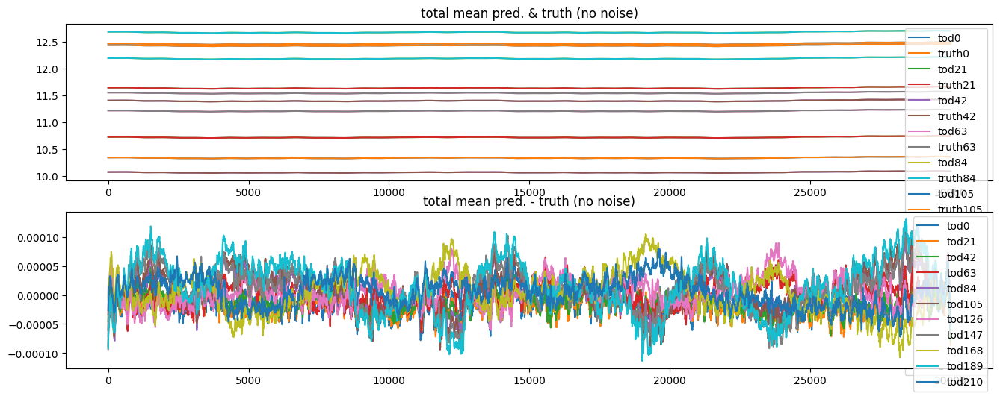

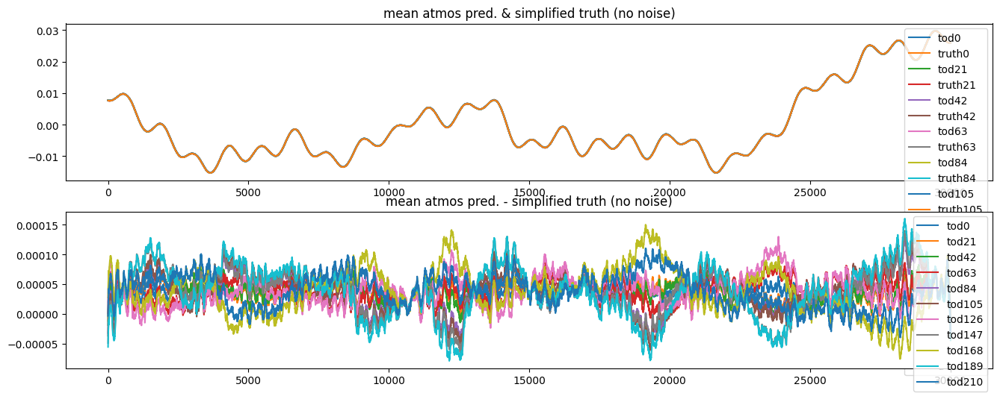

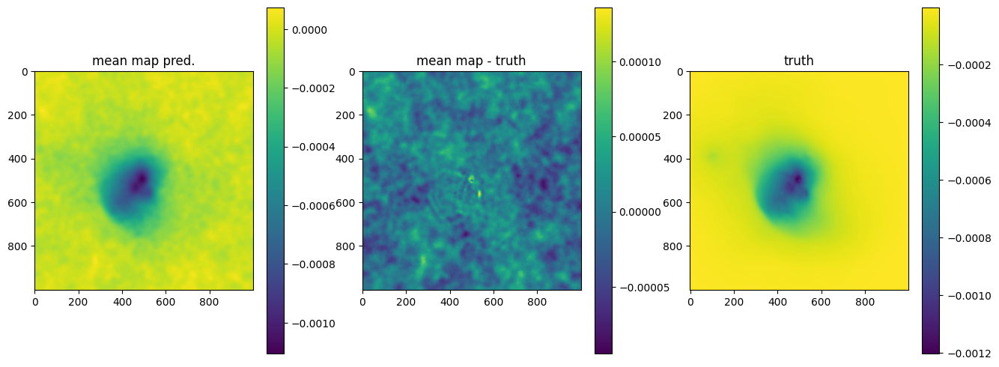

In [31]:
n_it = 20

if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    iter = opt_state[0]
    printevery = 2 #10
    if iter % printevery != 0: return

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i, 100:-100], label=f"truth{i}")
        # axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i, 100:-100], label=f"tod{i}")

    axes_tods[0].title.set_text('total mean pred. & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('total mean pred. - truth (no noise)')
    axes_tods[1].legend()

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    preds = []
    for x in samples:
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = gp_tod(x_tod)

        # From TOD-only fit:
        # preds += [res_tods[:, padding_atmos//2:-padding_atmos//2] * slopes_truth[:, None] + offset_tod_truth[:, None], ]
        preds += [res_tods[:, padding_atmos//2:-padding_atmos//2], ]

    mean_atmos, std = jft.mean_and_std(tuple(preds))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[0].plot(atmos_tod_simplified[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i] - atmos_tod_simplified[i], label=f"tod{i}")
        # axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean[i] - mean_atmos[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean atmos pred. & simplified truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean atmos pred. - simplified truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    # mean_map, _ = jft.mean_and_std(tuple(gp_map(s)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] for s in samples))
    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0, 0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0, 0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=20),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

# Extended Model:

In [32]:
samples.pos
initial_pos = {}
for k in samples.pos:
    if k == 'combcf xi':
        initial_pos[k] = jax.numpy.broadcast_to(samples.pos['combcf xi'], (n, samples.pos['combcf xi'].shape[1]))
    else:
        initial_pos[k] = samples.pos[k]

initial_pos = jft.Vector(initial_pos)

print(initial_pos)
initial_pos['combcf xi'].shape

Vector(
	{'cfmapax1fluctuations': Array(-19.70587367, dtype=float64),
	 'cfmapax1loglogavgslope': Array(6.85400879, dtype=float64),
	 'cfmapxi': Array([[ 1.22261317e+00,  1.45704908e+01, -1.61234694e+01, ...,
	         4.90680338e-01, -3.21060137e+00,  6.73591127e+00],
	       [ 9.83346540e+00, -1.08532293e+01,  1.07119424e+01, ...,
	         2.90120255e+00, -1.23728537e-01, -4.77555352e+00],
	       [-4.84554471e+00,  6.67198469e+00, -1.12055056e+01, ...,
	        -1.13823068e+00,  2.97120202e+00, -7.43547671e-01],
	       ...,
	       [ 5.87621489e+00, -4.26979473e+00, -8.89389245e-03, ...,
	        -4.04313016e+00,  5.61697880e+00, -6.83037268e+00],
	       [-1.09394872e+01,  1.24735982e+01, -5.09195755e+00, ...,
	         2.72513244e+00, -5.24028502e+00,  9.35817838e+00],
	       [ 1.46584323e+01, -1.57707351e+01,  1.36134395e+01, ...,
	        -2.02937863e+00,  6.00648342e+00, -8.95242864e+00]],      dtype=float64),
	 'cfmapzeromode': Array(-0.27832362, dtype=float64),
	 'combcf t

(217, 40000)

In [33]:
# put together in correlated field model
# Custom CFM:
cfm_tod = CFM("combcf ")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
gp_tod = cfm_tod.finalize(n)
# gp_tod = cfm_tod.finalize(1)
gp_tod

Model(
	<function CFM.finalize.<locals>.correlated_field at 0x14b9e0122ca0>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x14bf904428e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x14bf904428e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x14bf904428e0>, primals=ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<function random_like at 0x1

In [34]:
# signal_response_tod = Signal_TOD(gp_tod, offset_tod_truth, slopes_truth, gp_map) # combined with truth offsets & slopes
signal_response_tod = Signal_TOD(gp_tod, offset_tod, slopes, gp_map) # combined with truth offsets & slopes
lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


In [35]:
x_tod = {k: initial_pos[k] for k in initial_pos if 'comb' in k}
gp_tod(x_tod).shape

(217, 40000)

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+3.4333e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+3.2993e+07 Δ⛰:1.3408e+06 ➽:1.0400e+01
SL: Iteration 2 ⛰:+3.1360e+07 Δ⛰:1.6332e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+2.7989e+06 Δ⛰:2.8561e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+4.6120e+05 Δ⛰:2.3377e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:-1.0517e+06 Δ⛰:1.5129e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:-2.6274e+06 Δ⛰:1.5756e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:-2.9167e+06 Δ⛰:2.8932e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:-2.9175e+06 Δ⛰:7.7740e+02 ➽:1.0400e+01
SL: Iteration 9 ⛰:-3.1767e+06 Δ⛰:2.5919e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:-3.6803e+06 Δ⛰:5.0362e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:-3.6885e+06 Δ⛰:8.1928e+03 ➽:1.0400e+01
SL: Iteration 12 ⛰:-3.8698e+06 Δ⛰:1.8133e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:-3.9467e+06 Δ⛰:7.6945e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-4.0664e+06 Δ⛰:1.1964e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:-4.0673e+06 Δ⛰:9.0289e+02 ➽:1.0400e+01
SL: Iteration 16 ⛰:-4.1283e+06 Δ⛰:6.1057e+04 ➽:1.0400e+01
SL: 

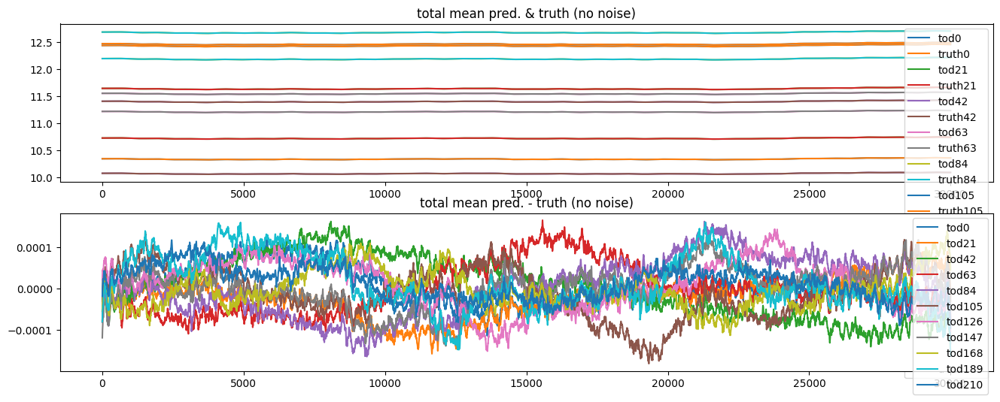

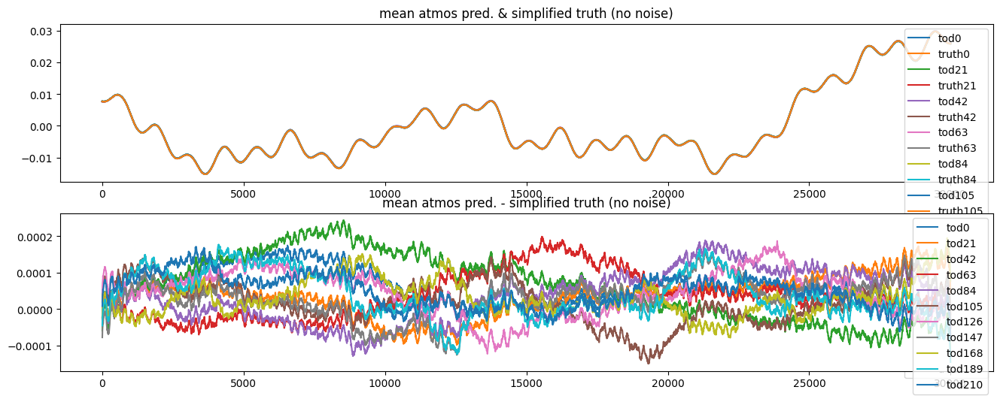

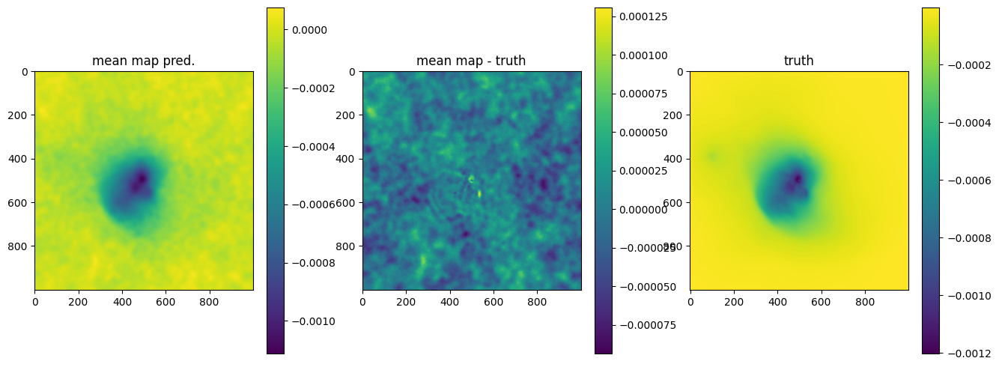

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+6.8096e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+4.2545e+07 Δ⛰:2.5552e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+4.0391e+07 Δ⛰:2.1534e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+3.7489e+06 Δ⛰:3.6642e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+8.4162e+05 Δ⛰:2.9073e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:-1.1861e+06 Δ⛰:2.0277e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:-2.6992e+06 Δ⛰:1.5131e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:-2.9705e+06 Δ⛰:2.7130e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:-2.9766e+06 Δ⛰:6.1077e+03 ➽:1.0400e+01
SL: Iteration 9 ⛰:-3.1877e+06 Δ⛰:2.1107e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:-3.6153e+06 Δ⛰:4.2764e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:-3.6231e+06 Δ⛰:7.8493e+03 ➽:1.0400e+01
SL: Iteration 12 ⛰:-3.8498e+06 Δ⛰:2.2670e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:-3.9338e+06 Δ⛰:8.3987e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-4.0487e+06 Δ⛰:1.1490e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:-4.0498e+06 Δ⛰:1.0994e+03 ➽:1.0400e+01
SL: Iteration 16 ⛰:-4.1302e+06 Δ⛰:8.0322e+04 ➽:1.0400e+01
SL: 

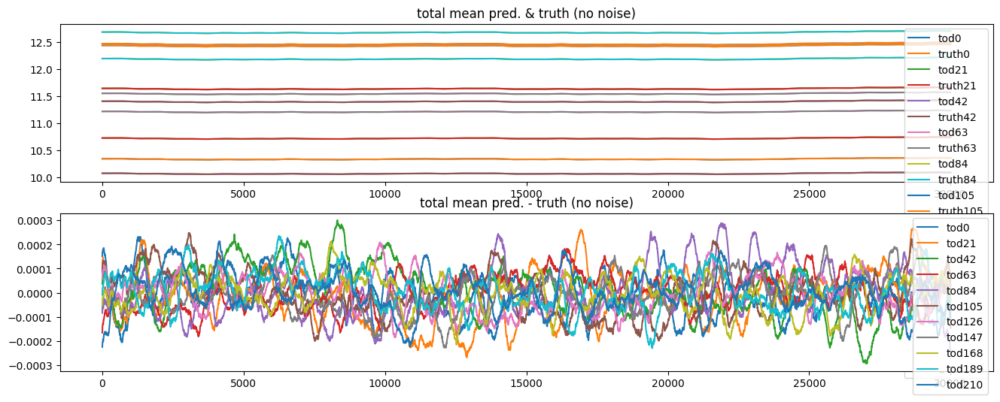

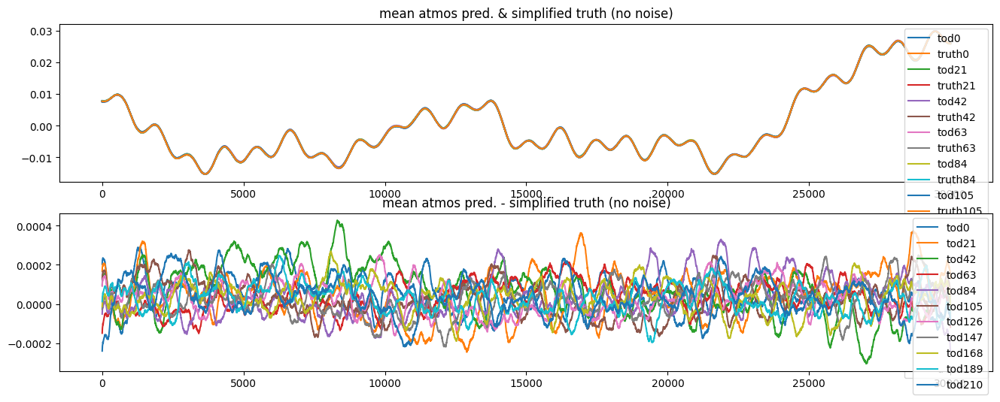

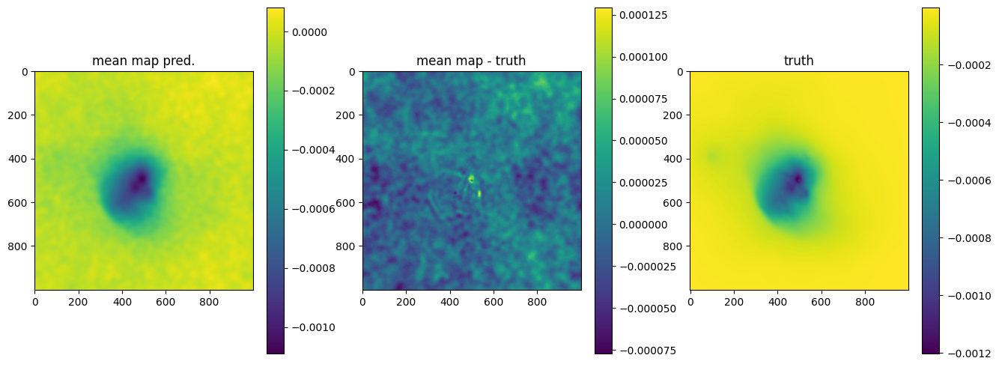

In [36]:
n_it = 2

if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    iter = opt_state[0]
    printevery = 1 #10
    if iter % printevery != 0: return

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i, 100:-100], label=f"truth{i}")
        # axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i, 100:-100], label=f"tod{i}")

    axes_tods[0].title.set_text('total mean pred. & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('total mean pred. - truth (no noise)')
    axes_tods[1].legend()

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    preds = []
    for x in samples:
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = gp_tod(x_tod)

        # From TOD-only fit:
        # preds += [res_tods[:, padding_atmos//2:-padding_atmos//2] * slopes_truth[:, None] + offset_tod_truth[:, None], ]
        preds += [res_tods[:, padding_atmos//2:-padding_atmos//2], ]

    mean_atmos, std = jft.mean_and_std(tuple(preds))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[0].plot(atmos_tod_simplified[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i] - atmos_tod_simplified[i], label=f"tod{i}")
        # axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean[i] - mean_atmos[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean atmos pred. & simplified truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean atmos pred. - simplified truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    # mean_map, _ = jft.mean_and_std(tuple(gp_map(s)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] for s in samples))
    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0, 0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0, 0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    # lh, # likelihood
    # jft.Vector(lh.init(k_i)), # initial position in model space (initialisation) # TODO: replace!!
    lh_tod,
    initial_pos,
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=20),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    # sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [37]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.0011142659686557317, 0.0015, 0.0001
	loglogvarslope: -2.7120017753088623, -2.45, 0.1
	zeromode std (LogNormal): 5.846286193632425e-06, 1e-05, 9.9e-06
map:
	fluctuations: 3.7154266483183925e-05, 5.6e-05, 1e-06
	loglogvarslope: -1.8310637131113066, -2.5, 0.1
	zeromode std (LogNormal): 5.697014112131743e-10, 1e-08, 1e-07


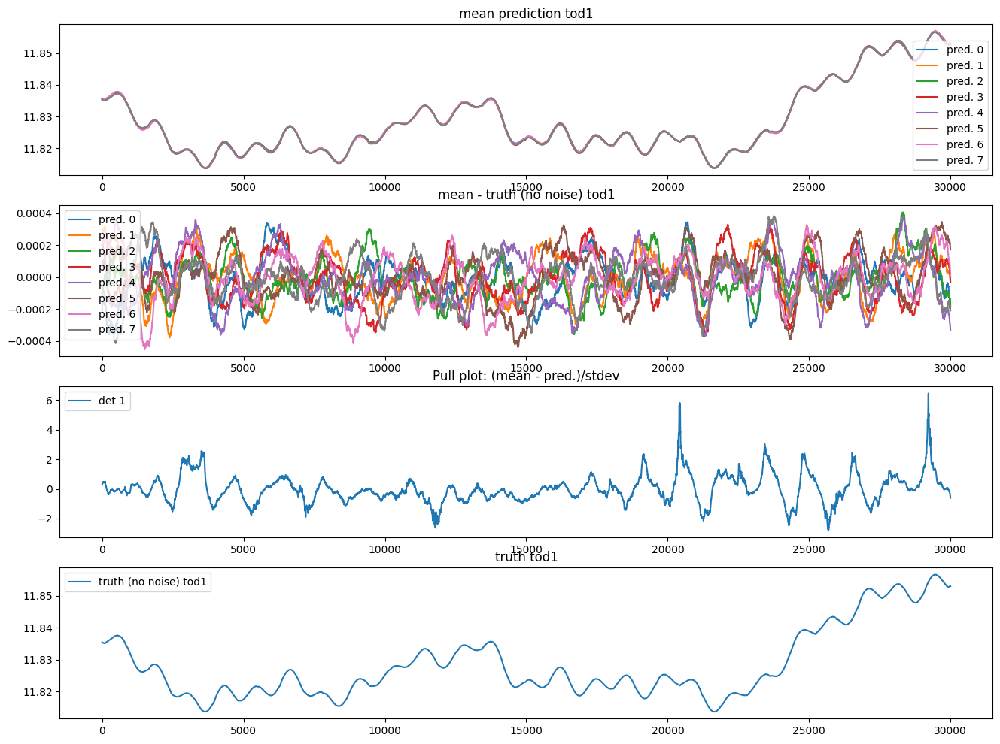

In [38]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    # im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i, 100:-100], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
# im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i, 100:-100])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

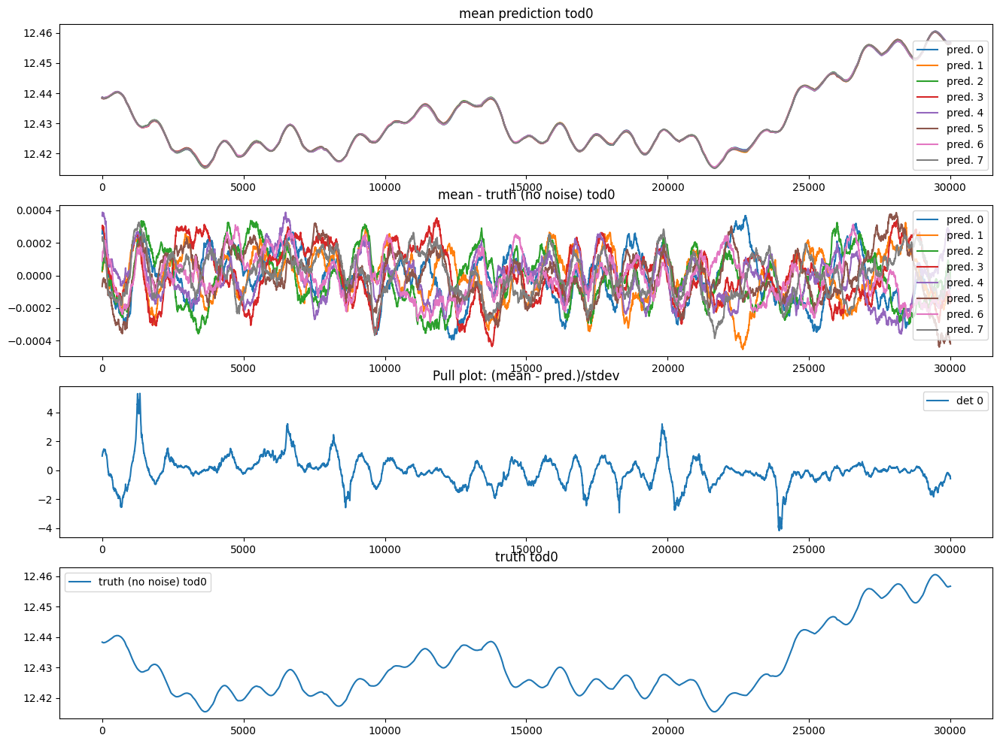

In [39]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 0 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    # im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i, 100:-100], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
# im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i, 100:-100])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

## Compare with maria mapper:

In [40]:
from maria.mappers import BinMapper

mapper = BinMapper(center=(150, 10),
                   frame="ra_dec",
                   width=0.1,
                   height=0.1,
                   resolution=2e-4,
                   tod_preprocessing={
                        "window": {"name": "hamming"},
                        "remove_modes": {"modes_to_remove": [0]},
                        "despline": {"knot_spacing": 10},
                    },
                    map_postprocessing={
                        "gaussian_filter": {"sigma": 1},
                        "median_filter": {"size": 1},
                    },
                  )

mapper.add_tods(tod_truthmap)
output_map = mapper.run()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:18<00:00, 18.34s/it]


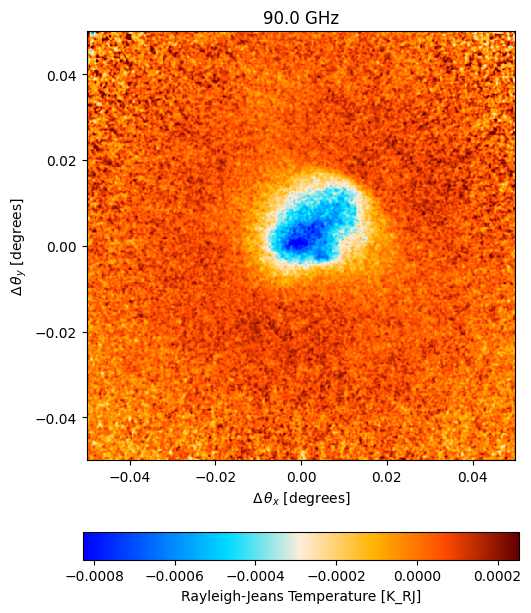

In [41]:
output_map.plot()

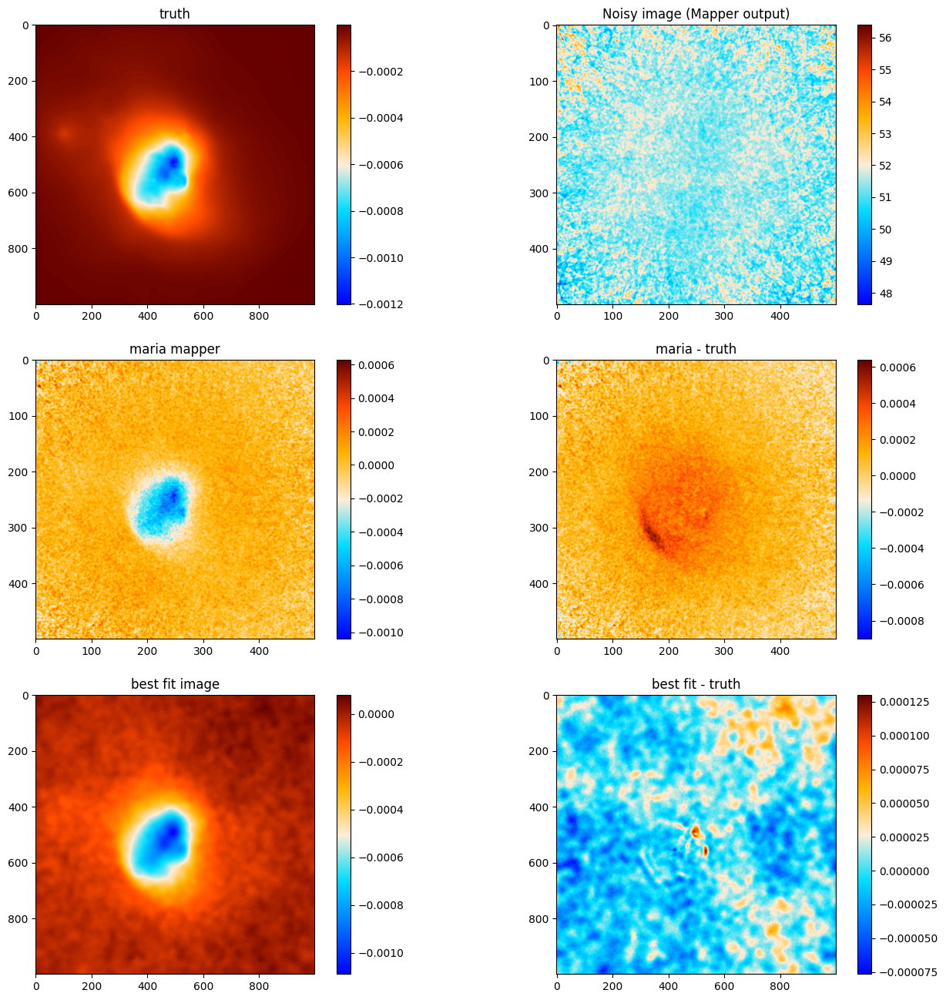

In [42]:
from skimage.transform import resize

# Compare nifty vs maria
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( mapdata_truth[0,0] , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(output_truthmap.data[0,0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow(output_map.data[0, 0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(mapdata_truth[0,0], (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow((output_map.data[0, 0] - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - mapdata_truth[0,0]), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - truth')
fig.colorbar(im4)

plt.show()

## Compare with smoothed truth

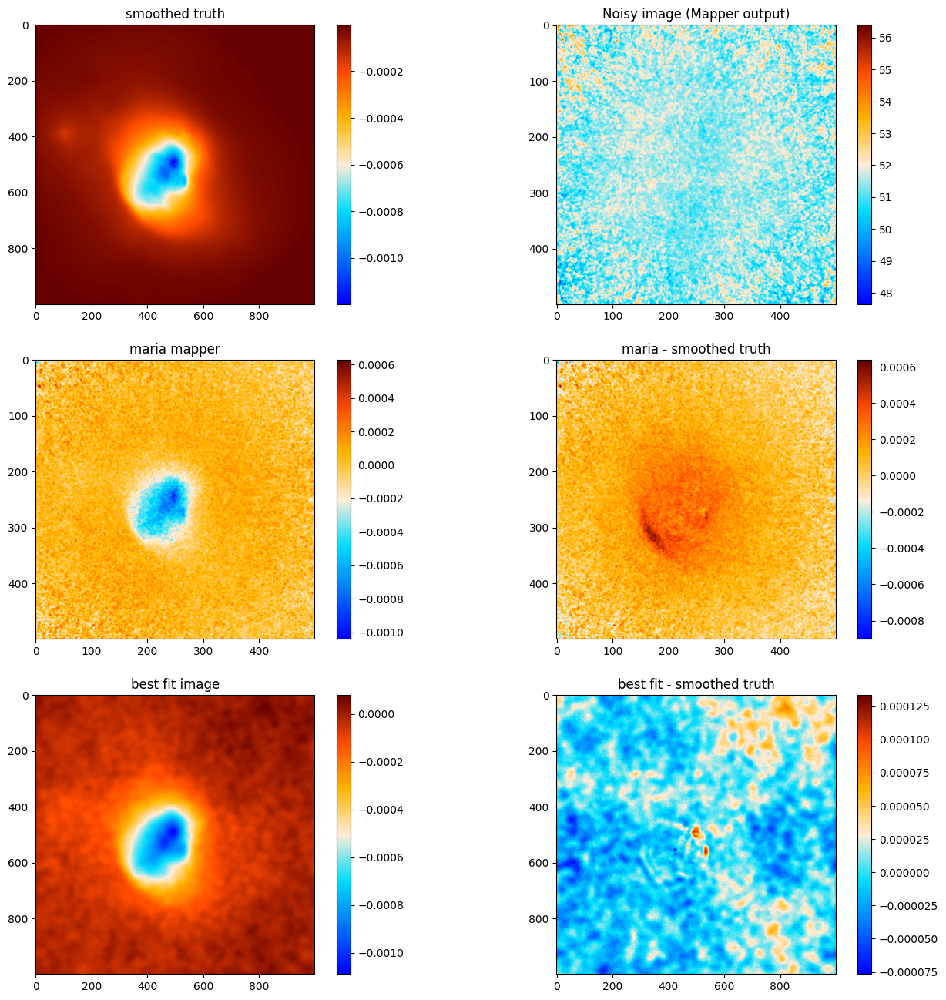

In [43]:
from skimage.transform import resize
from scipy.ndimage import uniform_filter

# Compare nifty vs maria
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

smoothed_truth = uniform_filter(mapdata_truth[0,0], size=4)
# smoothed_truth = output_map_truth.data[0,0]

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( smoothed_truth , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('smoothed truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(output_truthmap.data[0,0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow(output_map.data[0, 0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(smoothed_truth, (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow((output_map.data[0, 0] - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - smoothed truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - smoothed_truth), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - smoothed truth')
fig.colorbar(im4)

plt.show()